# INTRODUCTION TO THE PROBLEM AND DATASET

## PROBLEM STATEMENT

> A leading fresh produce supply chain company is revolutionizing the agricultural sector by integrating `technology` and `automation`. It directly sources vegetables from `farmers` and delivers them to businesses within hours, ensuring `quality` and `efficiency`. To optimize operations, an `AI-driven` classification system is needed for accurate and automated sorting.  

> The challenge lies in differentiating between `onions`, `potatoes`, `tomatoes`, and `market scenes` under varying `lighting`, `angles`, and `backgrounds`. A `multiclass classifier` must be developed to correctly categorize these images while identifying unrelated ones as `noise`, reducing manual effort and improving accuracy. 


## OBJECTIVE OF THE PROJECT

> This project aims to develop a `deep learning-based` image classifier that accurately identifies `onions`, `potatoes`, and `tomatoes` while filtering out `market scenes`. The model should handle variations in `lighting`, `angles`, and `backgrounds` to ensure `reliable performance`.  

> By automating `produce identification`, the system will minimize `manual sorting`, enhance `inventory management`, and optimize `distribution`. This will help reduce `errors`, decrease `waste`, and improve overall `supply chain efficiency`.

## IMPORT ALL THE REQUIRED LIBRARIES

In [154]:
# Standard library imports
import os
import glob
import zipfile
import pickle
import random

# Scientific computing and data handling
import numpy as np
import pandas as pd

# Deep learning and neural networks
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, regularizers,Sequential

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Machine learning metrics
import sklearn.metrics as metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score

# mlflow logging
import mlflow
import mlflow.tensorflow

# File downloading
import gdown

# Image processing
import cv2

## IMPORT DATASET

### Download the zip file

In [97]:
import gdown

# File ID from your URL
file_id = "1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT"
url = f"https://drive.google.com/uc?id={file_id}"

# Output file name
output = "downloaded_file.zip"

# Download the file
gdown.download(url, output, quiet=False)

print(f"File downloaded as {output}")

Downloading...
From (original): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT
From (redirected): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT&confirm=t&uuid=2f71366b-b3ce-4fa1-b2f1-3cb275fc79ed
To: c:\Users\saina\Desktop\DS_ML_AI\Scaler\Module_20_Computer_Vision\Case_studies\Ninja_cart\Multiclass_Vegetable_Image_Classification_Using_Deep_Learning\notebook\downloaded_file.zip
100%|██████████| 275M/275M [00:54<00:00, 5.02MB/s] 

File downloaded as downloaded_file.zip


### Unzip the files

In [98]:
# File to be unzipped
zip_file = "downloaded_file.zip"  # Update this if the file has a specific extension like 'downloaded_file.zip'

# Output directory
output_dir = "unzipped_files"

# Check if the file exists and is a ZIP file
if zipfile.is_zipfile(zip_file):
    # Create the output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)
    
    # Unzipping the file
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(output_dir)
    print(f"Files extracted to: {output_dir}")
else:
    print(f"{zip_file} is not a valid ZIP file.")


Files extracted to: unzipped_files


### Dataset Description 

> `unzipped_files` as `ninjacart_data` folder.  Ninjacart has two folders in it.
> 1. `train`
> 2. `test`

> Both train and test have four sub folders
> 1. `indian market` - (images related to market)
> 2. `onion` - (images related to onions)
> 3. `potato` - (images related to potatoes)
> 4. `tomato` - (images related to tomatoes)

# EXPLORATORY DATA ANALYSIS

## VISUALISING RANDOM IMAGES FROM DATASET

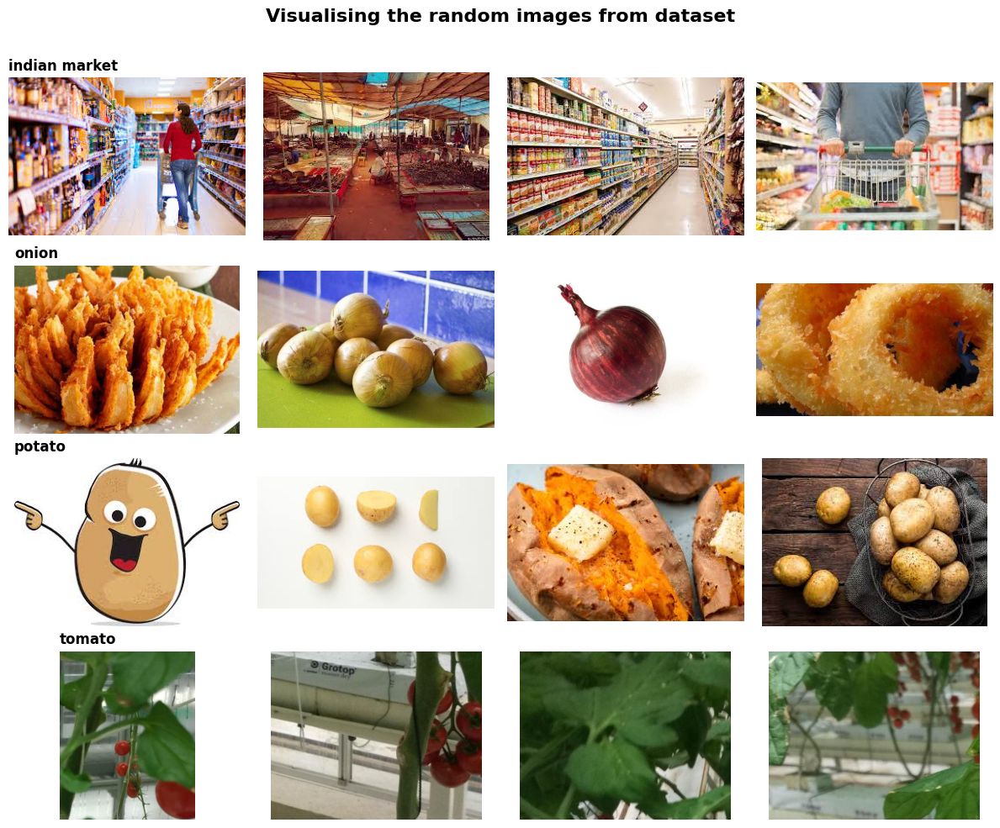

In [99]:
# Define the path to the training dataset
train_dir = r"unzipped_files\ninjacart_data\train"

# Set random seed for reproducibility
random.seed(42)

# Get class names (folder names) dynamically
class_names = [d for d in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, d))]

# Number of images to display per class
num_images = 4

# Set up the figure
fig, axes = plt.subplots(len(class_names), num_images, figsize=(12, 10))
fig.suptitle("Visualising the random images from dataset", fontsize=16, fontweight="bold")

for i, class_name in enumerate(class_names):
    class_path = os.path.join(train_dir, class_name)
    
    # Get all image file names in the class folder
    image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    
    # Select random images
    selected_images = random.sample(image_files, min(num_images, len(image_files)))
    
    for j, image_file in enumerate(selected_images):
        image_path = os.path.join(class_path, image_file)
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR (OpenCV default) to RGB
        
        # Display the image
        axes[i, j].imshow(image)
        axes[i, j].axis("off")

    # Set class name as row title
    axes[i, 0].set_title(class_name, fontsize=12, fontweight="bold", loc="left")

# Adjust layout and show the plot
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to accommodate the overall title
plt.show()

## CREATING RANDOM IMAGE DICTIONARY AND COUNT DICTIONARY

In [100]:
# Define dataset directories
dataset_dirs = {
    "train": r"unzipped_files/ninjacart_data/train",
    "test": r"unzipped_files/ninjacart_data/test"
}

# Store class directories separately for future use in dictionary format
class_dir = {"train": [], "test": []}

# Dictionaries to store image counts and random images
image_dict = {"train": {}, "test": {}}
count_dict = {"train": {}, "test": {}}

# Set random seed for reproducibility
random.seed(42)

# Process both train and test datasets
for dataset in ["train", "test"]:
    path = dataset_dirs[dataset]  # Get dataset path
    class_dir[dataset] = [d for d in os.listdir(path) if os.path.isdir(os.path.join(path, d))]  # Get class names
    
    for cls in class_dir[dataset]:
        # Get all image paths in the class folder
        file_paths = glob.glob(os.path.join(path, cls, '*'))
        
        # Store the number of images per class
        count_dict[dataset][cls] = len(file_paths)
        
        # Select a random image from the class and store it
        if file_paths:  # Ensure there are images before choosing
            image_path = random.choice(file_paths)
            image_dict[dataset][cls] = tf.keras.utils.load_img(image_path)

print("class_dir :",class_dir)
print("image_dict :",image_dict)
print("count_dict :",count_dict)


class_dir : {'train': ['indian market', 'onion', 'potato', 'tomato'], 'test': ['indian market', 'onion', 'potato', 'tomato']}
image_dict : {'train': {'indian market': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=275x183 at 0x2AA16FE7230>, 'onion': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x355 at 0x2AA16C5FF50>, 'potato': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=259x194 at 0x2AA17253F80>, 'tomato': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=400x500 at 0x2AA17253F20>}, 'test': {'indian market': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=259x194 at 0x2AF86D06930>, 'onion': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=470x470 at 0x2AA59399D00>, 'potato': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=286x176 at 0x2AA170AB320>, 'tomato': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=400x500 at 0x2AF99797DA0>}}
count_dict : {'train': {'indian market': 599, 'onion': 849, 'potato': 898, 'tomato': 789}, 'tes

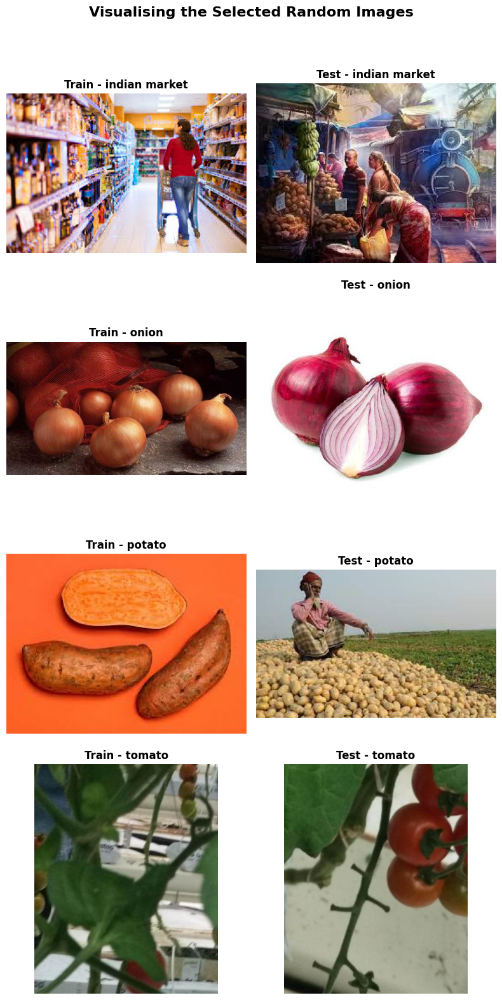

In [101]:
# Plot the selected random images
num_classes = len(class_dir["train"])  # Number of classes (assuming same for train & test)
fig, axes = plt.subplots(num_classes, 2, figsize=(8, 4 * num_classes))  # 2 columns (Train & Test)

# Main Title
fig.suptitle("Visualising the Selected Random Images", fontsize=16, fontweight="bold")

# Plot images
for i, cls in enumerate(class_dir["train"]):  # Iterate through train classes (assuming same for test)
    # Train Image
    if cls in image_dict["train"]:
        axes[i, 0].imshow(image_dict["train"][cls])
        axes[i, 0].set_title(f"Train - {cls}", fontsize=12, fontweight="bold")
        axes[i, 0].axis("off")
    
    # Test Image
    if cls in image_dict["test"]:
        axes[i, 1].imshow(image_dict["test"][cls])
        axes[i, 1].set_title(f"Test - {cls}", fontsize=12, fontweight="bold")
        axes[i, 1].axis("off")

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

## IMAGE DIMENSIONS

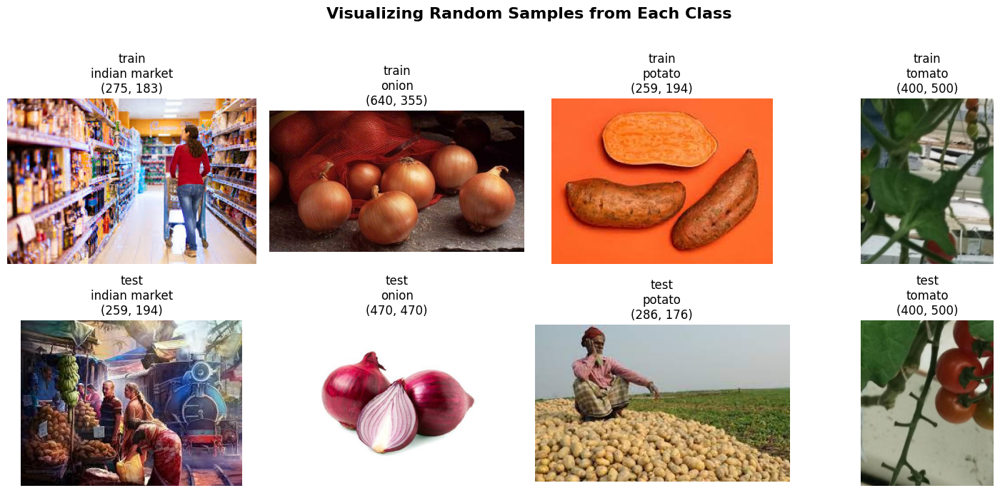

In [102]:
# Define number of classes (assuming same for train & test)
num_classes = len(image_dict["train"])

# Create a figure with 2 rows (train & test), num_classes columns
fig, axes = plt.subplots(2, num_classes, figsize=(15, 7))

# Set overall title
fig.suptitle("Visualizing Random Samples from Each Class", fontsize=16, fontweight="bold")

# Iterate over train and test datasets
for row, dataset in enumerate(["train", "test"]):  # Row 0: Train, Row 1: Test
    for col, cls in enumerate(image_dict[dataset]):  # Iterate through class names
        img = image_dict[dataset][cls]  # Get the selected image
        
        # Plot image
        ax = axes[row, col]
        ax.imshow(img)
        ax.set_title(f'{dataset}\n{cls}\n{img.size}', fontsize=12)
        ax.axis("off")
        
    # Add dataset title on the leftmost side of each row
    axes[row, 0].set_ylabel(dataset.upper(), fontsize=14, fontweight="bold", rotation=90, labelpad=20)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


**Observation**
> Clearly, we can observe that every image of different dimensions.

> We need to resize them to some square shape before applying the CNN models 

> As we are doing vegetable classification, `indian market` images will be treated as `noise` images.

## CLASS DISTRIBUTION ANALYSIS

Count of train samples per class:
            class  count
0  indian market    599
1          onion    849
2         potato    898
3         tomato    789 



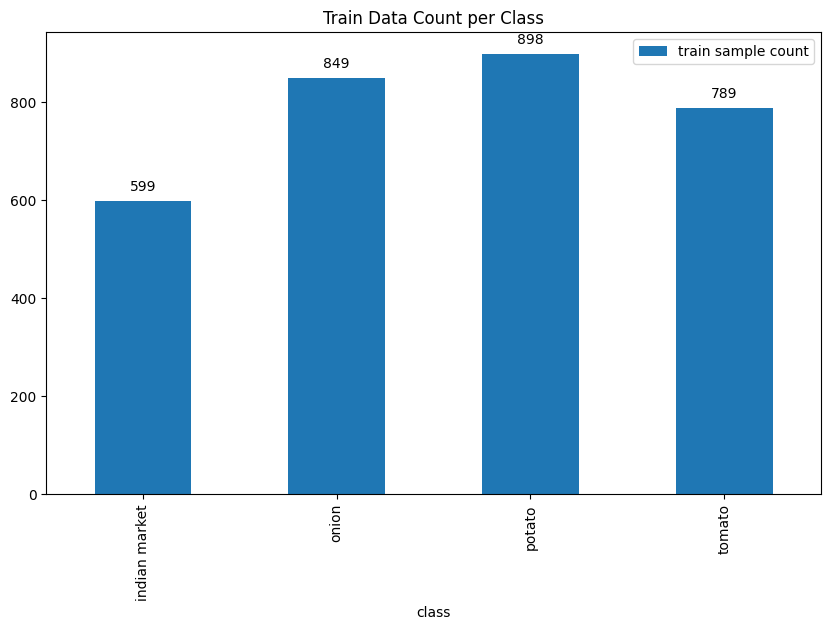

Count of test samples per class:
            class  count
0  indian market     81
1          onion     83
2         potato     81
3         tomato    106 



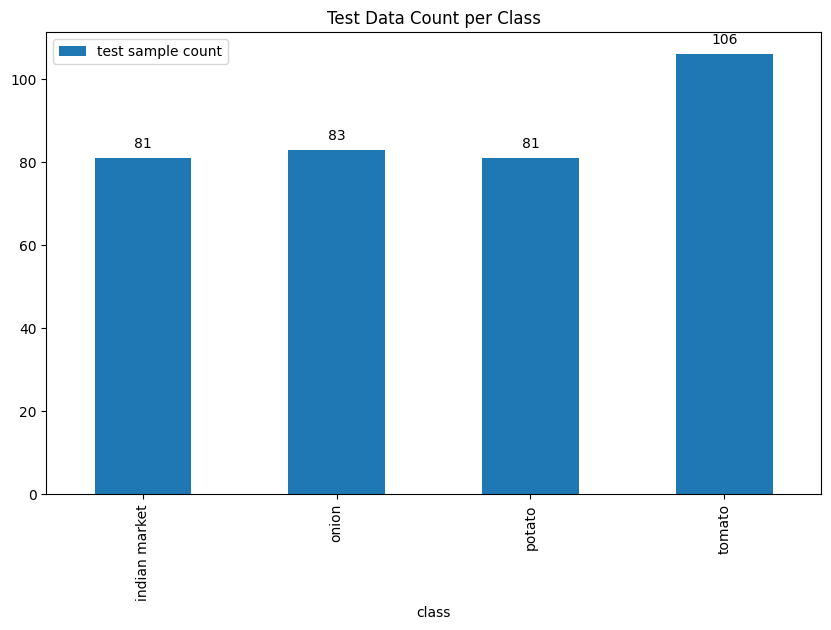

In [103]:
# Function to plot data distribution
def plot_data_distribution(dataset_type, count_dict):
    # Convert count_dict to DataFrame
    df_count = pd.DataFrame({
        "class": list(count_dict.keys()),     # Get class names
        "count": list(count_dict.values()),   # Get image counts
    })

    print(f"Count of {dataset_type} samples per class:\n", df_count, "\n")

    # Create bar plot
    ax = df_count.plot.bar(x='class', y='count', title=f"{dataset_type.capitalize()} Data Count per Class", 
                           label=f'{dataset_type} sample count', figsize=(10, 6))

    # Annotate bars with their counts
    for bar in ax.patches:
        ax.annotate(f'{bar.get_height()}', (bar.get_x() + bar.get_width() / 2., bar.get_height()),
                    ha='center', va='center', xytext=(0, 10), textcoords='offset points')

    plt.show()

# Plot Training Data Distribution
plot_data_distribution("train", count_dict["train"])

# Plot Test Data Distribution
plot_data_distribution("test", count_dict["test"])


**Observation**
> We have unbalanced Dataset in both training and testing dataset

# DATA PREPROCESSING

## TRAIN, VALIDATION ,TEST SPLIT AND RESIZING TO (256,256)


Loading Data...

Found 3135 files belonging to 4 classes.
Using 2508 files for training.
Found 3135 files belonging to 4 classes.
Using 627 files for validation.
Found 351 files belonging to 4 classes.
Dataset Image Counts


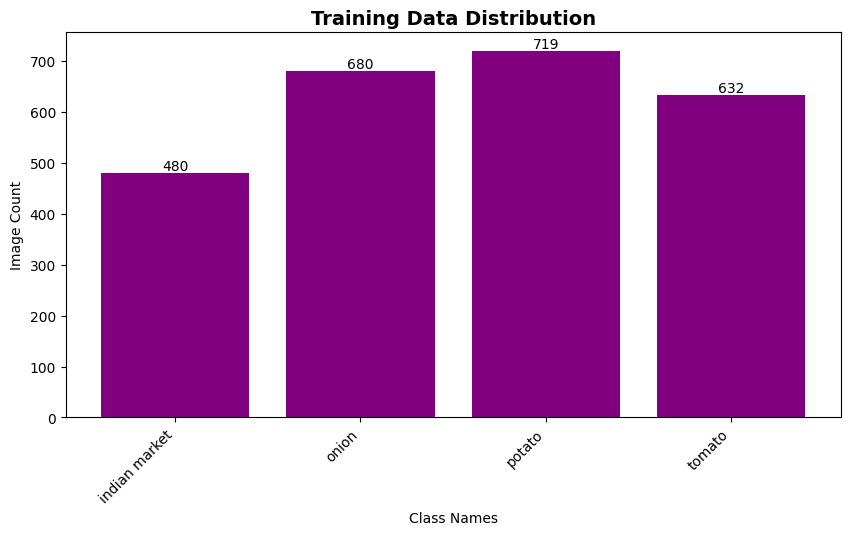

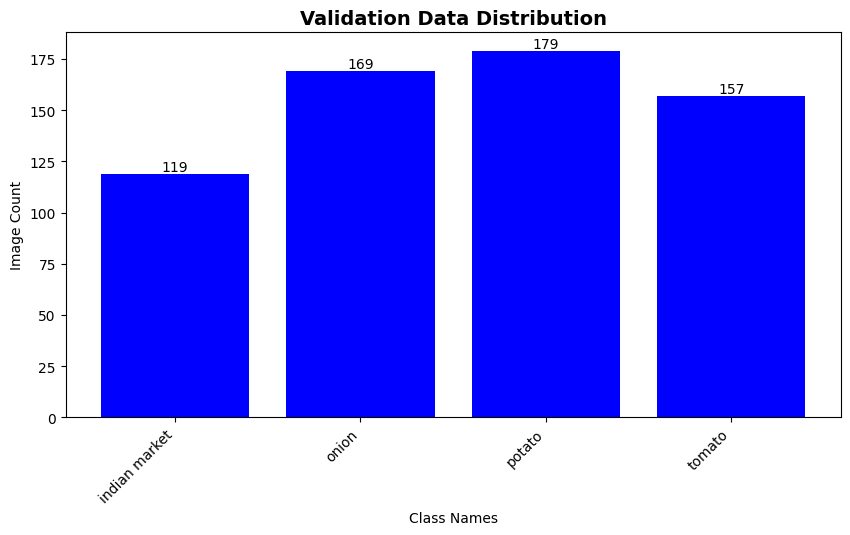

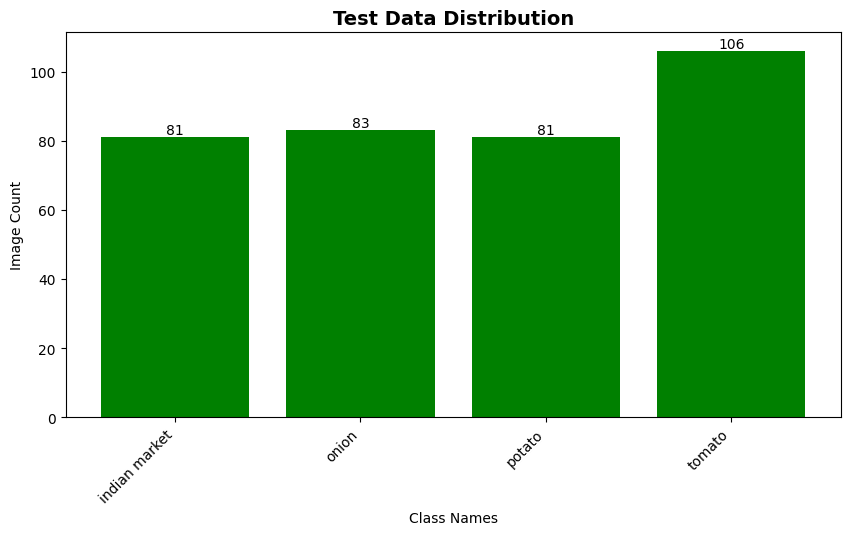

In [104]:
def load_data(base_dir="unzipped_files/ninjacart_data", validation_split=0.2):
    # Ensure data folders exist
    assert os.path.exists(f"{base_dir}/train") and os.path.exists(f"{base_dir}/test")

    print('\nLoading Data...\n')

    # Function to count images in each class
    def count_images(dataset_type):
        dataset_path = f"{base_dir}/{dataset_type}"
        class_dirs = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
        class_counts = {cls: len(glob.glob(os.path.join(dataset_path, cls, '*'))) for cls in class_dirs}
        return class_counts

    # Count images in train and test sets before splitting
    train_counts = count_images("train")
    test_counts = count_images("test")  # Added explicitly for clarity

    # Load the train dataset and apply validation split
    train_data = tf.keras.preprocessing.image_dataset_from_directory(
        f"{base_dir}/train",
        shuffle=True,
        label_mode='categorical',
        batch_size=32,
        validation_split=validation_split,
        subset='training',
        image_size = (256,256),
        seed=123
    )

    # Validation data (from the same directory, using validation_split)
    val_data = tf.keras.preprocessing.image_dataset_from_directory(
        f"{base_dir}/train",
        shuffle=True,
        label_mode='categorical',
        batch_size=32,
        validation_split=validation_split,
        subset='validation',
        image_size = (256,256),
        seed=123
    )

    # Load the test data (no split applied)
    test_data = tf.keras.preprocessing.image_dataset_from_directory(
        f"{base_dir}/test",
        shuffle=False,
        label_mode='categorical',
        batch_size=32,
        image_size = (256,256)
    )

    # Get class names
    class_names = train_data.class_names

    # Compute validation image counts using the split ratio
    val_counts = {cls: int(train_counts[cls] * validation_split) for cls in class_names}

    # Adjust training counts after validation split
    train_counts = {cls: train_counts[cls] - val_counts[cls] for cls in class_names}

    # Print dataset statistics
    print("Dataset Image Counts")

        # Convert counts into DataFrames
    df_train = pd.DataFrame(list(train_counts.items()), columns=["Class", "Count"])
    df_val = pd.DataFrame(list(val_counts.items()), columns=["Class", "Count"])
    df_test = pd.DataFrame(list(test_counts.items()), columns=["Class", "Count"])

    # Function to plot bar charts
    def plot_counts(df, title, color):
        plt.figure(figsize=(10, 5))
        bars = plt.bar(df["Class"], df["Count"], color=color)
        plt.xlabel("Class Names")
        plt.ylabel("Image Count")
        plt.title(title, fontsize=14, fontweight="bold")
        plt.xticks(rotation=45, ha="right")

        # Annotate bar heights
        for bar in bars:
            plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f"{bar.get_height()}", 
                    ha='center', va='bottom', fontsize=10)

        plt.show()

    # Plot training, validation, and test image distributions
    plot_counts(df_train, "Training Data Distribution", "purple")
    plot_counts(df_val, "Validation Data Distribution", "blue")
    plot_counts(df_test, "Test Data Distribution", "green")

    return train_data, val_data, test_data, class_names

# Call the function to load data
train_data, val_data, test_data, class_names = load_data()

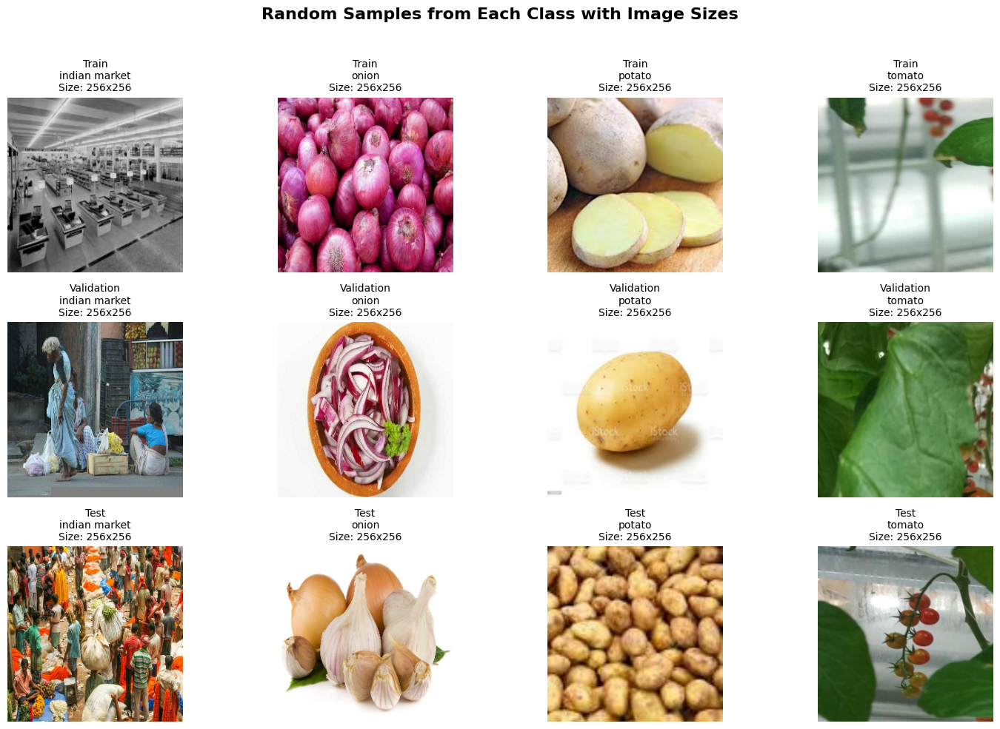

In [105]:
# Function to extract one random image per class from a dataset
def get_random_images(dataset, class_names):
    class_images = {}  # Dictionary to store random images
    for images, labels in dataset:  # Iterate over batches
        for img, lbl in zip(images.numpy(), labels.numpy()):
            class_idx = np.argmax(lbl)  # Get class index
            class_name = class_names[class_idx]  # Map index to class name
            if class_name not in class_images:  # Store only one image per class
                class_images[class_name] = img
            if len(class_images) == len(class_names):  # Stop when all classes are covered
                return class_images
    return class_images

# Fetch one random image per class from each dataset
train_images = get_random_images(train_data, class_names)
val_images = get_random_images(val_data, class_names)
test_images = get_random_images(test_data, class_names)

# Define number of classes
num_classes = len(class_names)

# Create a figure with 3 rows (Train, Validation, Test) and num_classes columns
fig, axes = plt.subplots(3, num_classes, figsize=(15, 10))

# Set overall title
fig.suptitle("Random Samples from Each Class with Image Sizes", fontsize=16, fontweight="bold")

# Iterate over train, val, and test datasets
for row, (dataset_name, dataset_images) in enumerate(zip(["Train", "Validation", "Test"], [train_images, val_images, test_images])):
    for col, cls in enumerate(class_names):  # Iterate through class names
        img = dataset_images.get(cls)  # Get the selected image
        if img is not None:
            ax = axes[row, col]
            ax.imshow(img.astype("uint8"))  # Convert image to displayable format

            # Extract image size (height, width, channels)
            img_size = img.shape  # (height, width, channels)
            size_text = f"{img_size[0]}x{img_size[1]}"  # Format size

            # Set title with dataset name, class, and image size
            ax.set_title(f"{dataset_name}\n{cls}\nSize: {size_text}", fontsize=10)
            ax.axis("off")

    # Add dataset title on the leftmost side of each row
    axes[row, 0].set_ylabel(dataset_name.upper(), fontsize=14, fontweight="bold", rotation=90, labelpad=20)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

**Observation**
> Dataset splitted into train, validation and test split

> Image sizes are resized to (256,256,3)

## RESIZING AND RESCALING

In [106]:
def preprocess(train_data, val_data, test_data, target_height=256, target_width=256):

    # Data Processing Stage with resizing and rescaling operations
    data_preprocess = keras.Sequential(
        name="data_preprocess",
        layers=[
            layers.Resizing(target_height, target_width),
            layers.Rescaling(1.0/255),
        ]
    )

    # Perform Data Processing on the train, val, test dataset
    train_ds = train_data.map(lambda x, y: (data_preprocess(x), y), num_parallel_calls=tf.data.AUTOTUNE)
    val_ds = val_data.map(lambda x, y: (data_preprocess(x), y), num_parallel_calls=tf.data.AUTOTUNE)
    test_ds = test_data.map(lambda x, y: (data_preprocess(x), y), num_parallel_calls=tf.data.AUTOTUNE)

    return train_ds, val_ds, test_ds

In [107]:
train_ds, val_ds, test_ds = preprocess(train_data, val_data, test_data)

**Observation**
> By using above preprocess function, we can resize the images to required size . Default = (256,256)

> RGB Intensities are normalised to (0 - 1) by rescaling. So when you plot the images again you have convert to original intensites to visualise.

# CUSTOMISED CNN MODELS FROM SCRATCH

## SIMPLE CNN MODEL ARCHITECTURE WITH ONE CONV2D BLOCK

In [108]:
def baseline(height=256, width=256, num_classes=4):
    hidden_size = 256

    model = keras.Sequential(
        name="simple_cnn1",
        layers=[
            layers.Conv2D(filters=16, kernel_size=3, padding="same", activation='relu', input_shape=(height, width, 3)),
            layers.MaxPooling2D(pool_size=2),
            layers.Flatten(),
            layers.Dense(units=hidden_size, activation='relu'),
            layers.Dense(units=num_classes, activation='softmax')  # Final output layer
        ]
    )
    return model

# Create and summarize the model
model = baseline()
model.summary()

C:\Users\saina\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "simple_cnn1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_16 (Conv2D)              │ (None, 256, 256, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 262144)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 256)            │    67,109,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 67,110,596 (256.01 MB)

 Trainable params: 67,110,596 (256.01 MB)

 Non-trainable params: 0 (0.00 B)

### Model Compilation and Training

In [110]:
def compile_train(model, train_ds, val_ds, epochs=10, ckpt_path=f"checkpoints/{model.name}.weights.h5"):
    # Compile the model
    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
    )

    # Define Callbacks
    callbacks = [
        keras.callbacks.ModelCheckpoint(
            ckpt_path, 
            save_weights_only=True,  # Saves only model weights
            monitor='val_accuracy', 
            mode='max', 
            save_best_only=True  # Saves only the best model based on validation accuracy
        ),
        keras.callbacks.TensorBoard(log_dir=f"logs/{model.name}", histogram_freq=1)  # TensorBoard Logging
    ]

    # Train the model
    model_fit = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=epochs,  # Now customizable
        callbacks=callbacks
    )

    return model_fit

In [111]:
model_fit = compile_train(model, train_ds, val_ds, epochs=10)

Epoch 1/10


79/79 ━━━━━━━━━━━━━━━━━━━━ 151s 2s/step - accuracy: 0.4589 - loss: 12.4082 - precision_3: 0.4692 - recall_3: 0.4351 - val_accuracy: 0.7640 - val_loss: 0.7298 - val_precision_3: 0.7993 - val_recall_3: 0.7049
Epoch 2/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 135s 2s/step - accuracy: 0.8415 - loss: 0.4920 - precision_3: 0.8682 - recall_3: 0.7960 - val_accuracy: 0.8230 - val_loss: 0.5489 - val_precision_3: 0.8468 - val_recall_3: 0.8022
Epoch 3/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - accuracy: 0.9299 - loss: 0.2492 - precision_3: 0.9384 - recall_3: 0.9186 - val_accuracy: 0.8054 - val_loss: 0.5695 - val_precision_3: 0.8198 - val_recall_3: 0.7911
Epoch 4/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 147s 2s/step - accuracy: 0.9430 - loss: 0.2048 - precision_3: 0.9515 - recall_3: 0.9379 - val_accuracy: 0.8246 - val_loss: 0.5674 - val_precision_3: 0.8361 - val_recall_3: 0.8134
Epoch 5/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - accuracy: 0.9748 - loss: 0.1040 - precision_3: 0.9792 - recall_3: 0.9714 - val_accuracy: 

### Plot Training and Validation Accuracy wrt Epoch

In [112]:
# helper function to annotate maximum values in the plots
def annot_max(x,y, xytext=(0.94,0.96), ax=None, only_y=True):
    xmax = x[np.argmax(y)]
    ymax = max(y)
    if only_y:
        text = "{:.2f}%".format(ymax)
    else:
        text= "x={:.2f}, y={:.2f}%".format(xmax, ymax)
    if not ax:
        ax=plt.gca()
    bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
    arrowprops=dict(arrowstyle="->",connectionstyle="angle,angleA=0,angleB=60")
    kw = dict(xycoords='data',textcoords="axes fraction",
              arrowprops=arrowprops, bbox=bbox_props, ha="right", va="top")
    ax.annotate(text, xy=(xmax, ymax), xytext=xytext, **kw)

def plot_accuracy(model_fit):
    #accuracy graph
    x = range(0,len(model_fit.history['accuracy']))
    y_train = [acc * 100 for acc in model_fit.history['accuracy']]
    y_val = [acc * 100 for acc in model_fit.history['val_accuracy']]

    plt.plot(x, y_train, label='Train', color='b')
    annot_max(x, y_train, xytext=(0.7,0.9))
    plt.plot(x, y_val, label='Val', color='r')
    annot_max(x, y_val, xytext=(0.8,0.7))
    plt.ylabel('Accuracy', fontsize=15)
    plt.xlabel('epoch', fontsize=15)
    plt.legend()
    plt.show()

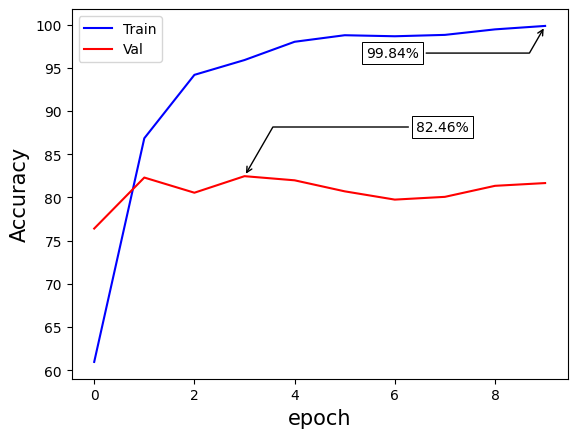

In [113]:
plot_accuracy(model_fit)

### Tensorboard Visualisation

In [114]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [116]:
%tensorboard --logdir logs/simple_cnn1/

Launching TensorBoard...

### Model Evaluation, Mlflow Logging and Printing Metrics

In [118]:
def evaluate_model(model, train_ds, val_ds, test_ds, class_names, run_name, ckpt_path):
    mlflow.set_experiment("Vegetable_image_classification")
    
    with mlflow.start_run(run_name=run_name):
        model.load_weights(ckpt_path)
        mlflow.tensorflow.log_model(model, "model")
        mlflow.log_param("checkpoint_path", ckpt_path)
        
        def get_metrics(ds, dataset_name):
            y_true, y_pred = [], []
            for x, y in ds:
                y_true.extend(tf.argmax(y, axis=1).numpy().tolist())
                preds = model(x, training=False)
                y_pred.extend(tf.argmax(preds, axis=1).numpy().tolist())

            acc = accuracy_score(y_true, y_pred) * 100
            prec = precision_score(y_true, y_pred, average="macro") * 100
            rec = recall_score(y_true, y_pred, average="macro") * 100

            mlflow.log_metric(f"{dataset_name}_accuracy", acc)
            mlflow.log_metric(f"{dataset_name}_precision", prec)
            mlflow.log_metric(f"{dataset_name}_recall", rec)
            
            print(f"\n{dataset_name} Metrics:")
            print(f" Accuracy: {acc:.2f}%")
            print(f" Precision: {prec:.2f}%")
            print(f" Recall: {rec:.2f}%")
            
            return y_true, y_pred
        
        train_y_true, train_y_pred = get_metrics(train_ds, "train")
        val_y_true, val_y_pred = get_metrics(val_ds, "val")
        test_y_true, test_y_pred = get_metrics(test_ds, "test")

        def plot_confusion_matrix(y_true, y_pred, dataset_name):
            cm = confusion_matrix(y_true, y_pred)
            plt.figure(figsize=(8, 6))
            sns.heatmap(cm, annot=True, fmt='g', cmap="Blues", xticklabels=class_names, yticklabels=class_names)
            plt.xlabel('Predicted Labels')
            plt.ylabel('True Labels')
            plt.title(f'Confusion Matrix - {dataset_name}')
            plt.savefig(f"conf_matrix_{dataset_name}.png")
            mlflow.log_artifact(f"conf_matrix_{dataset_name}.png")
            plt.show()
            plt.close()
        
        plot_confusion_matrix(train_y_true, train_y_pred, "train")
        plot_confusion_matrix(val_y_true, val_y_pred, "val")
        plot_confusion_matrix(test_y_true, test_y_pred, "test")

        def log_classification_report(y_true, y_pred, dataset_name):
            report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
            mlflow.log_dict(report, f"classification_report_{dataset_name}.json")
            print(f"\nClassification Report - {dataset_name}")
            print(classification_report(y_true, y_pred, target_names=class_names))
        
        log_classification_report(train_y_true, train_y_pred, "train")
        log_classification_report(val_y_true, val_y_pred, "val")
        log_classification_report(test_y_true, test_y_pred, "test")
        
        print("\nClass-wise Accuracy:")
        for dataset_name, y_true, y_pred in zip(["train", "val", "test"], [train_y_true, val_y_true, test_y_true], [train_y_pred, val_y_pred, test_y_pred]):
            print(f"\n{dataset_name.capitalize()} Class-wise Accuracy:")
            for i, class_name in enumerate(class_names):
                total_count = y_true.count(i)
                correct_count = sum(1 for true, pred in zip(y_true, y_pred) if true == pred and true == i)
                class_acc = (correct_count / total_count) * 100 if total_count > 0 else 0
                mlflow.log_metric(f"{dataset_name}_class_accuracy_{class_name}", class_acc)
                print(f" {class_name}: {class_acc:.2f}% ({correct_count}/{total_count})")
        
        print("\nRandom Test Predictions:")
        samples_per_class = 2
        fig, axes = plt.subplots(len(class_names), samples_per_class, figsize=(10, 2 * len(class_names)))

        test_images = list(test_ds.unbatch().as_numpy_iterator())
        grouped_by_class = {i: [] for i in range(len(class_names))}

        for img, label in test_images:
            class_idx = np.argmax(label)
            grouped_by_class[class_idx].append((img, class_idx))

        for row, cls_idx in enumerate(grouped_by_class):
            selected_samples = random.sample(grouped_by_class[cls_idx], min(samples_per_class, len(grouped_by_class[cls_idx])))

            for col, (img, true_label) in enumerate(selected_samples):
                img_input = np.expand_dims(img, axis=0)
                pred = model(img_input, training=False)
                predicted_label = np.argmax(pred)

                ax = axes[row, col]
                
                # **Fix: Rescale image to original format (0-255) and convert to uint8**
                img = (img * 255).astype("uint8")
                
                ax.imshow(img)
                ax.set_title(f"True: {class_names[true_label]}\nPred: {class_names[predicted_label]}")
                ax.axis("off")

        plt.tight_layout()
        plt.savefig("random_test_predictions.png")
        mlflow.log_artifact("random_test_predictions.png")
        plt.show()

        mlflow.end_run()

2025/02/08 16:22:50 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.
2025/02/08 16:23:19 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.



train Metrics:
 Accuracy: 98.13%
 Precision: 98.15%
 Recall: 98.24%

val Metrics:
 Accuracy: 82.46%
 Precision: 83.77%
 Recall: 82.21%

test Metrics:
 Accuracy: 76.07%
 Precision: 78.53%
 Recall: 74.41%


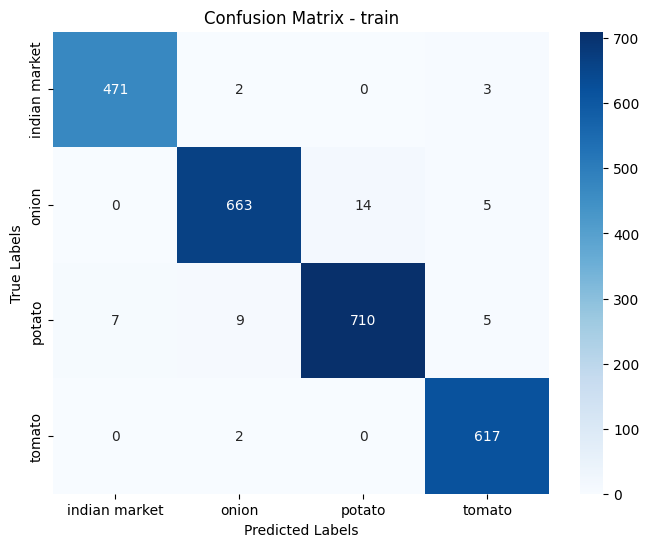

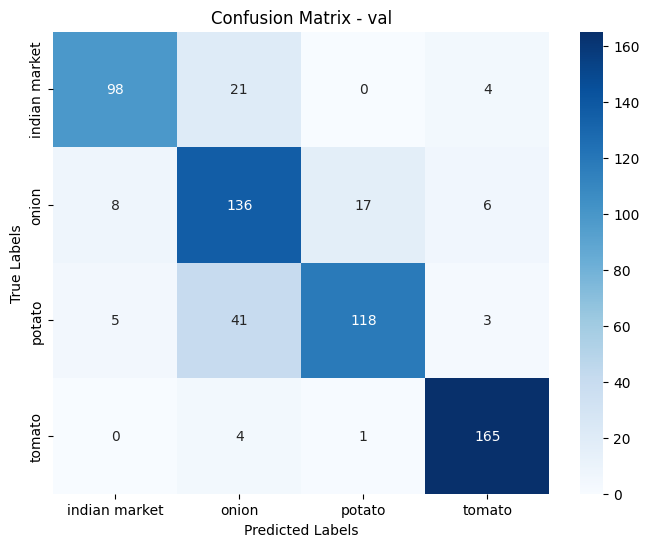

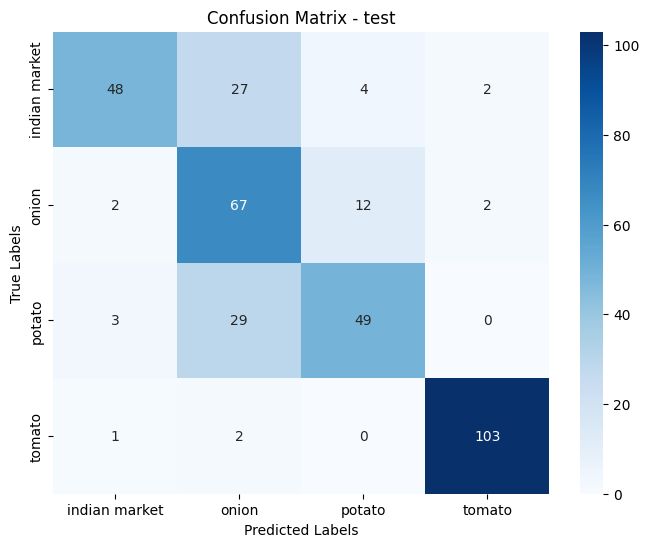


Classification Report - train
               precision    recall  f1-score   support

indian market       0.99      0.99      0.99       476
        onion       0.98      0.97      0.98       682
       potato       0.98      0.97      0.98       731
       tomato       0.98      1.00      0.99       619

     accuracy                           0.98      2508
    macro avg       0.98      0.98      0.98      2508
 weighted avg       0.98      0.98      0.98      2508


Classification Report - val
               precision    recall  f1-score   support

indian market       0.88      0.80      0.84       123
        onion       0.67      0.81      0.74       167
       potato       0.87      0.71      0.78       167
       tomato       0.93      0.97      0.95       170

     accuracy                           0.82       627
    macro avg       0.84      0.82      0.83       627
 weighted avg       0.83      0.82      0.83       627


Classification Report - test
               precision

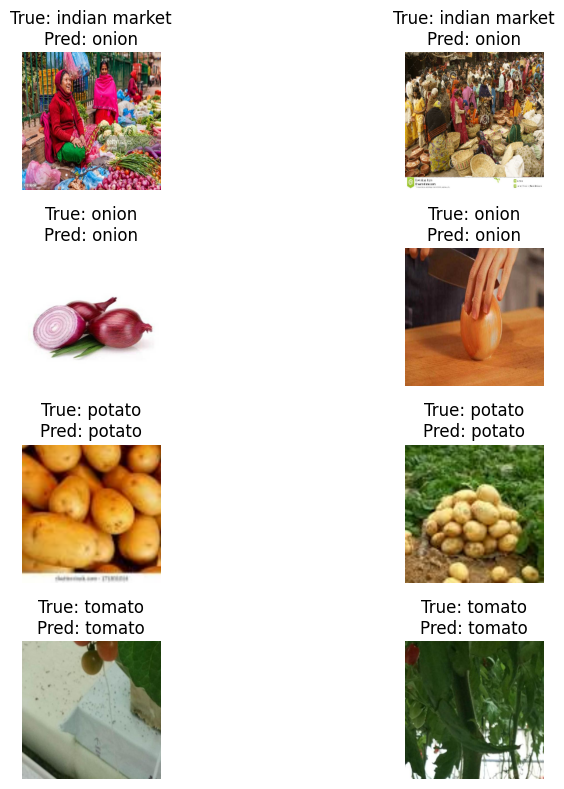

In [119]:
evaluate_model(model, train_ds, val_ds, test_ds, class_names,run_name=f"{model.name}",ckpt_path= f"checkpoints/{model.name}.weights.h5")

### Save the model

In [120]:
model.save("saved_models/simple_cnn1_model.keras")

## CNN MODEL WITH MULTIPLE CONV2D BLOCKS, MAX POOLING, GLOBAL AVERAGE POLLING, 

In [121]:
def arch_1(height=256, width=256):
    num_classes = 4
    hidden_size = 256

    model = keras.Sequential(
        name="cnn_multiple_conv",
        layers=[
            layers.Conv2D(filters=16, kernel_size=3, padding="same", activation='relu', input_shape=(height, width, 3)),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=32, kernel_size=3, padding="same", activation='relu'),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=64, kernel_size=3, padding="same", activation='relu'),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=128, kernel_size=3, padding="same", activation='relu'),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=256, kernel_size=3, padding="same", activation='relu'),
            # layers.MaxPooling2D(),
            # layers.Flatten(),
            layers.GlobalAveragePooling2D(),
            layers.Dense(units=hidden_size, activation='relu'),
            layers.Dense(units=num_classes, activation='softmax')
        ]
    )
    return model

In [122]:
model = arch_1()
model.summary()

C:\Users\saina\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "cnn_multiple_conv"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_17 (Conv2D)              │ (None, 256, 256, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 128, 128, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 459,428 (1.75 MB)

 Trainable params: 459,428 (1.75 MB)

 Non-trainable params: 0 (0.00 B)

### Model Compilation and Training including all Callback Features

In [123]:
def compile_train(model, train_ds, val_ds, epochs=10, ckpt_path = f"checkpoints/{model.name}.weights.h5"):
    # Compile the model
    model.compile(
        optimizer=tf.keras.optimizers.Adam(),  # Default Adam optimizer
        loss="categorical_crossentropy",
        metrics=["accuracy", tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
    )

    # Define Callbacks
    callbacks = [
        # Reduce learning rate if validation loss stops improving
        keras.callbacks.ReduceLROnPlateau(
            monitor="val_loss", factor=0.3, patience=5, min_lr=1e-5
        ),
        # Save only the best model based on validation accuracy
        keras.callbacks.ModelCheckpoint(
            ckpt_path,
            save_weights_only=True,
            monitor="val_accuracy",
            mode="max",
            save_best_only=True
        ),
        # Stop training early if validation loss does not improve
        keras.callbacks.EarlyStopping(
            monitor="val_loss",
            patience=10,
            min_delta=0.001,
            mode="min",
            restore_best_weights=True  # Restore the best model
        ),
        # TensorBoard logging
        keras.callbacks.TensorBoard(log_dir=f"logs/{model.name}", histogram_freq=1)
    ]

    # Train the model
    model_fit = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=epochs,
        callbacks=callbacks
    )

    return model_fit

In [124]:
model_fit = compile_train(model, train_ds, val_ds, epochs=30)

Epoch 1/30
79/79 ━━━━━━━━━━━━━━━━━━━━ 45s 497ms/step - accuracy: 0.4162 - loss: 1.1854 - precision_4: 0.5075 - recall_4: 0.1390 - val_accuracy: 0.6842 - val_loss: 0.7371 - val_precision_4: 0.7775 - val_recall_4: 0.5630 - learning_rate: 0.0010
Epoch 2/30
79/79 ━━━━━━━━━━━━━━━━━━━━ 37s 468ms/step - accuracy: 0.6780 - loss: 0.7400 - precision_4: 0.7563 - recall_4: 0.5723 - val_accuracy: 0.7209 - val_loss: 0.6277 - val_precision_4: 0.7833 - val_recall_4: 0.6746 - learning_rate: 0.0010
Epoch 3/30
79/79 ━━━━━━━━━━━━━━━━━━━━ 38s 469ms/step - accuracy: 0.7506 - loss: 0.6110 - precision_4: 0.8137 - recall_4: 0.6866 - val_accuracy: 0.7831 - val_loss: 0.5527 - val_precision_4: 0.8076 - val_recall_4: 0.7432 - learning_rate: 0.0010
Epoch 4/30
79/79 ━━━━━━━━━━━━━━━━━━━━ 38s 472ms/step - accuracy: 0.7685 - loss: 0.5815 - precision_4: 0.8135 - recall_4: 0.7089 - val_accuracy: 0.7863 - val_loss: 0.5155 - val_precision_4: 0.8163 - val_recall_4: 0.7512 - learning_rate: 0.0010
Epoch 5/30
79/79 ━━━━━━━━━━━

### Plot accuracy for training and validation wrt epoch

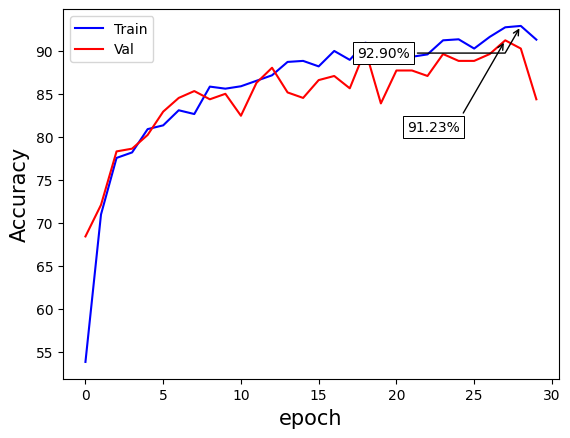

In [125]:
plot_accuracy(model_fit)

### Tensorboard

In [88]:
# !rm -rf logs/
# rmdir /s /q logs

In [128]:

%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


### Model Evaluation, Mlflow Logging and Printing Metrics

2025/02/08 16:51:29 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.
2025/02/08 16:51:49 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.



train Metrics:
 Accuracy: 94.18%
 Precision: 94.29%
 Recall: 94.72%

val Metrics:
 Accuracy: 91.23%
 Precision: 91.10%
 Recall: 91.50%

test Metrics:
 Accuracy: 92.59%
 Precision: 92.22%
 Recall: 92.14%


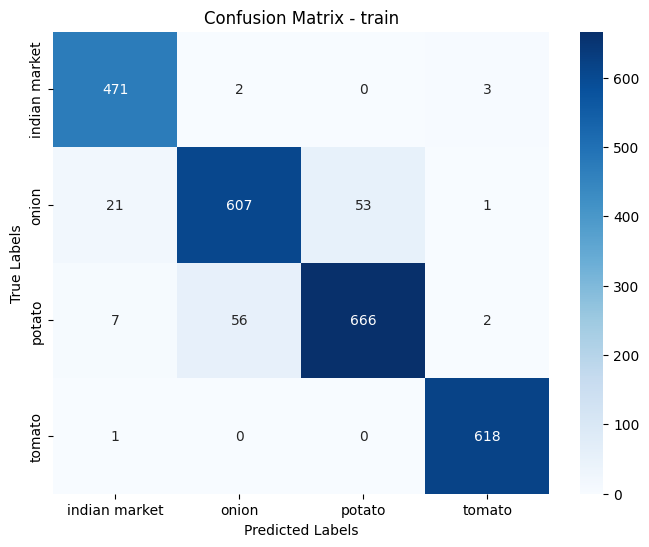

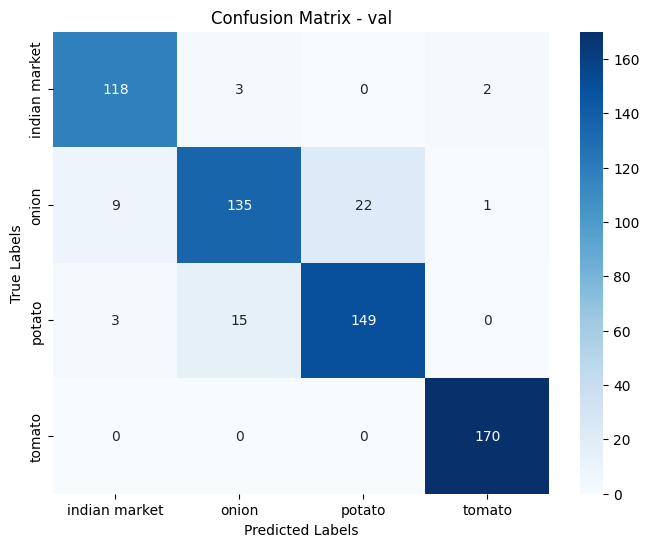

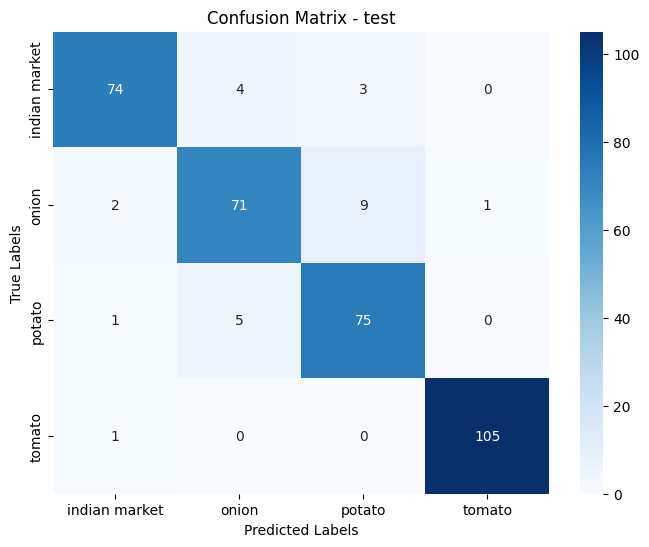


Classification Report - train
               precision    recall  f1-score   support

indian market       0.94      0.99      0.97       476
        onion       0.91      0.89      0.90       682
       potato       0.93      0.91      0.92       731
       tomato       0.99      1.00      0.99       619

     accuracy                           0.94      2508
    macro avg       0.94      0.95      0.94      2508
 weighted avg       0.94      0.94      0.94      2508


Classification Report - val
               precision    recall  f1-score   support

indian market       0.91      0.96      0.93       123
        onion       0.88      0.81      0.84       167
       potato       0.87      0.89      0.88       167
       tomato       0.98      1.00      0.99       170

     accuracy                           0.91       627
    macro avg       0.91      0.91      0.91       627
 weighted avg       0.91      0.91      0.91       627


Classification Report - test
               precision

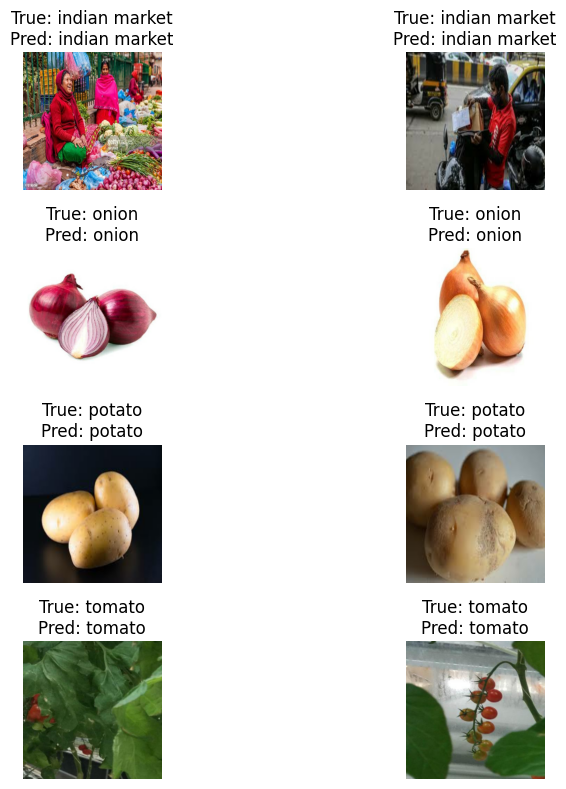

In [134]:
evaluate_model(model, train_ds, val_ds, test_ds, class_names,run_name="cnn_multiple_conv",ckpt_path= f"checkpoints/{model.name}.weights.h5")

## CNN MODEL WITH MULTIPLE CONV2D ALONG WITH BATCH NORMALIZATION AND DENSE DROPOUT

In [136]:
def arch_2(height=256, width=256):
    num_classes = 4
    hidden_size = 256

    model = keras.Sequential(
        name="cnn_multiple_conv_bn",
        layers=[
            layers.Conv2D(filters=16, kernel_size=3, padding="same", input_shape=(height, width, 3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=32, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=64, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=128, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=256, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            # layers.MaxPooling2D(),
            # layers.Flatten(),
            layers.GlobalAveragePooling2D(),
            layers.Dense(units=hidden_size),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.Dropout(0.5),
            layers.Dense(units=num_classes, activation='softmax')
        ]
    )
    return model

In [137]:
model = arch_2()
model.summary()

C:\Users\saina\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "cnn_multiple_conv_bn"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_22 (Conv2D)              │ (None, 256, 256, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 256, 256, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256, 256, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 128, 128, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_24 (Conv2D)              │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_21 (MaxPooling2D) │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 256)            │             

 Total params: 462,436 (1.76 MB)

 Trainable params: 460,932 (1.76 MB)

 Non-trainable params: 1,504 (5.88 KB)

### Model Compilation and Training including all Callback Features

In [143]:
model_fit = compile_train(model, train_ds, val_ds, epochs=30,ckpt_path=f"checkpoints/{model.name}.weights.h5")

Epoch 1/30


79/79 ━━━━━━━━━━━━━━━━━━━━ 90s 1s/step - accuracy: 0.9124 - loss: 0.2631 - precision_6: 0.9171 - recall_6: 0.9064 - val_accuracy: 0.7368 - val_loss: 2.2327 - val_precision_6: 0.7395 - val_recall_6: 0.7337 - learning_rate: 0.0010
Epoch 2/30
79/79 ━━━━━━━━━━━━━━━━━━━━ 78s 982ms/step - accuracy: 0.8956 - loss: 0.2690 - precision_6: 0.9031 - recall_6: 0.8923 - val_accuracy: 0.8389 - val_loss: 0.5231 - val_precision_6: 0.8441 - val_recall_6: 0.8373 - learning_rate: 0.0010
Epoch 3/30
79/79 ━━━━━━━━━━━━━━━━━━━━ 79s 994ms/step - accuracy: 0.9040 - loss: 0.2421 - precision_6: 0.9098 - recall_6: 0.8974 - val_accuracy: 0.8453 - val_loss: 0.6670 - val_precision_6: 0.8585 - val_recall_6: 0.8421 - learning_rate: 0.0010
Epoch 4/30
79/79 ━━━━━━━━━━━━━━━━━━━━ 74s 940ms/step - accuracy: 0.8991 - loss: 0.2975 - precision_6: 0.9065 - recall_6: 0.8937 - val_accuracy: 0.8804 - val_loss: 0.4099 - val_precision_6: 0.8814 - val_recall_6: 0.8772 - learning_rate: 0.0010
Epoch 5/30
79/79 ━━━━━━━━━━━━━━━━━━━━ 64s 

### Plot accuracy for training and validation wrt epoch

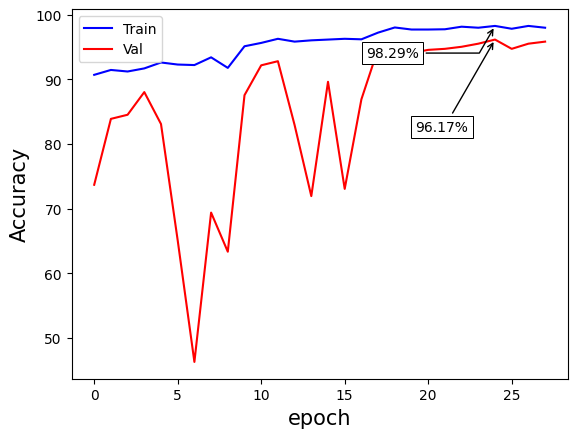

In [144]:
plot_accuracy(model_fit)

### Tensorboard

In [145]:

%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


### Model Evaluation, Mlflow Logging and Printing Metrics

In [142]:
model.name

'cnn_multiple_conv_bn'

2025/02/08 18:08:18 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.
2025/02/08 18:08:27 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.



train Metrics:
 Accuracy: 99.64%
 Precision: 99.68%
 Recall: 99.68%

val Metrics:
 Accuracy: 96.17%
 Precision: 96.26%
 Recall: 96.19%

test Metrics:
 Accuracy: 92.88%
 Precision: 93.01%
 Recall: 92.31%


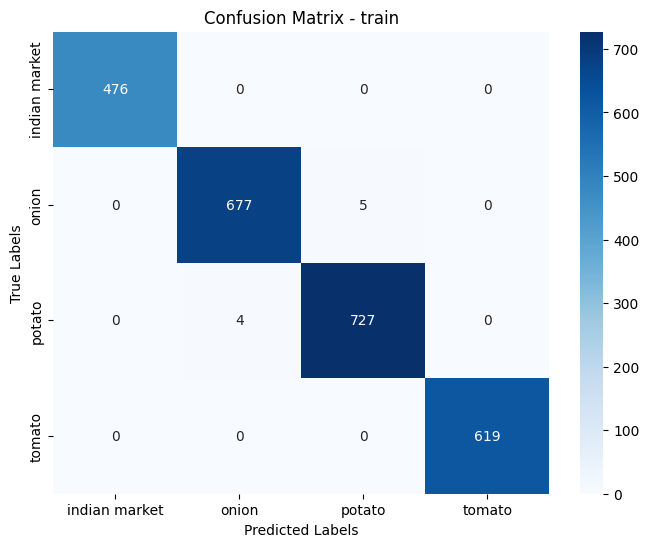

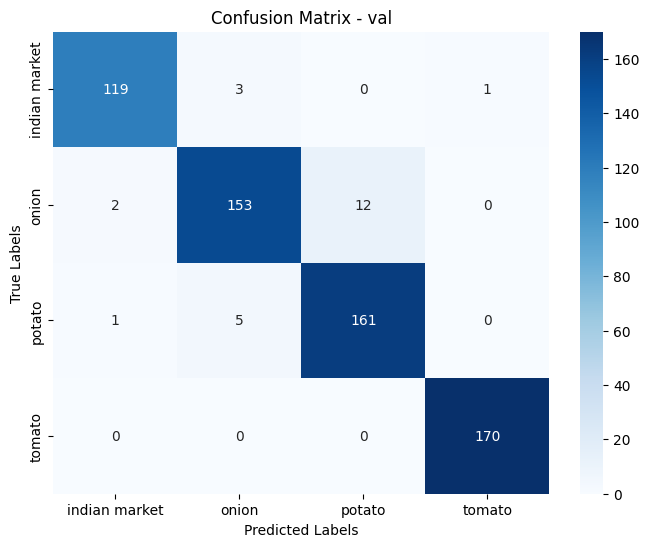

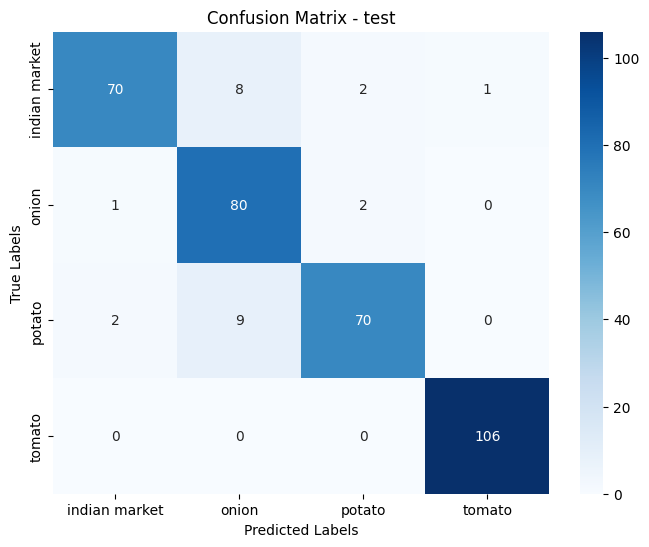


Classification Report - train
               precision    recall  f1-score   support

indian market       1.00      1.00      1.00       476
        onion       0.99      0.99      0.99       682
       potato       0.99      0.99      0.99       731
       tomato       1.00      1.00      1.00       619

     accuracy                           1.00      2508
    macro avg       1.00      1.00      1.00      2508
 weighted avg       1.00      1.00      1.00      2508


Classification Report - val
               precision    recall  f1-score   support

indian market       0.98      0.97      0.97       123
        onion       0.95      0.92      0.93       167
       potato       0.93      0.96      0.95       167
       tomato       0.99      1.00      1.00       170

     accuracy                           0.96       627
    macro avg       0.96      0.96      0.96       627
 weighted avg       0.96      0.96      0.96       627


Classification Report - test
               precision

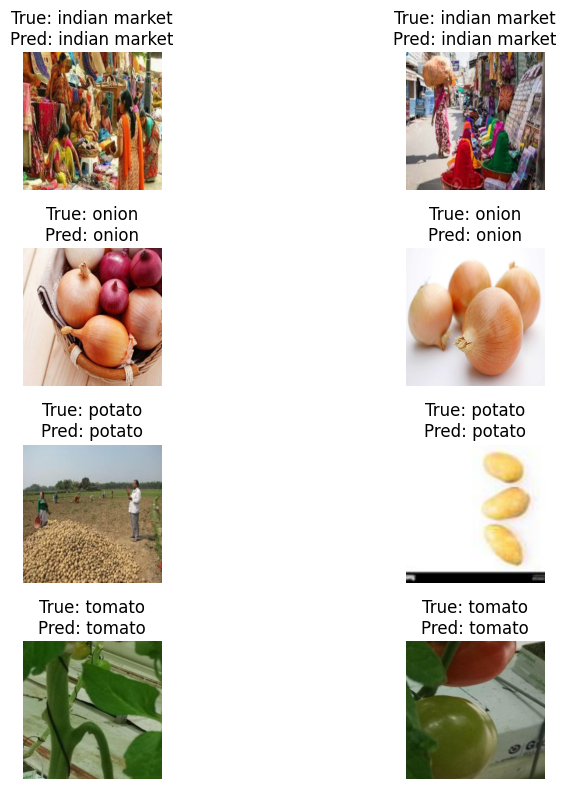

In [146]:
evaluate_model(model, train_ds, val_ds, test_ds, class_names,run_name=f"{model.name}",ckpt_path= f"checkpoints/{model.name}.weights.h5")

## CNN MODEL WITH MULTIPLE CONV2D WITH BATCH NORMALIZATION, DROPOUT AND REGULARIZATION

In [147]:
def arch_3(height=128, width=128):
    num_classes = 4
    hidden_size = 256

    model = keras.Sequential(
        name="cnn_multiple_conv_bn_reg",
        layers=[
            layers.Conv2D(filters=16, kernel_size=3, padding="same", input_shape=(height, width, 3),
                            kernel_regularizer=regularizers.l2(1e-3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=32, kernel_size=3, padding="same",
                            kernel_regularizer=regularizers.l2(1e-3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=64, kernel_size=3, padding="same",
                            kernel_regularizer=regularizers.l2(1e-3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=128, kernel_size=3, padding="same",
                            kernel_regularizer=regularizers.l2(1e-3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=256, kernel_size=3, padding="same",
                            kernel_regularizer=regularizers.l2(1e-3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            # layers.MaxPooling2D(),
            # layers.Flatten(),
            layers.GlobalAveragePooling2D(),
            layers.Dense(units=hidden_size, kernel_regularizer=regularizers.l2(1e-3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.Dropout(0.5),
            layers.Dense(units=num_classes, activation='softmax')
        ]
    )
    return model

In [148]:
model = arch_3()
model.summary()

C:\Users\saina\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "cnn_multiple_conv_bn_reg"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_27 (Conv2D)              │ (None, 128, 128, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_6 (Activation)       │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 128, 128, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_22 (MaxPooling2D) │ (None, 64, 64, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_28 (Conv2D)              │ (None, 64, 64, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_7 (Activation)       │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_23 (MaxPooling2D) │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_8 (Activation)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_24 (MaxPooling2D) │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_30 (Conv2D)              │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_9 (Activation)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_25 (MaxPooling2D) │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_31 (Conv2D)              │ (None, 8, 8, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_10 (Activation)      │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_5      │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_11 (Activation)      │ (None, 256)            │             

 Total params: 462,436 (1.76 MB)

 Trainable params: 460,932 (1.76 MB)

 Non-trainable params: 1,504 (5.88 KB)

### Model Compilation and Training including all Callback Features

In [149]:
model_fit = compile_train(model, train_ds, val_ds, epochs=30,ckpt_path=f"checkpoints/{model.name}.weights.h5")

Epoch 1/30
79/79 ━━━━━━━━━━━━━━━━━━━━ 61s 727ms/step - accuracy: 0.6385 - loss: 1.6988 - precision_7: 0.6678 - recall_7: 0.6032 - val_accuracy: 0.3620 - val_loss: 2.1757 - val_precision_7: 0.4004 - val_recall_7: 0.3078 - learning_rate: 0.0010
Epoch 2/30
79/79 ━━━━━━━━━━━━━━━━━━━━ 57s 725ms/step - accuracy: 0.7865 - loss: 1.1967 - precision_7: 0.8089 - recall_7: 0.7617 - val_accuracy: 0.4721 - val_loss: 1.9708 - val_precision_7: 0.5234 - val_recall_7: 0.3923 - learning_rate: 0.0010
Epoch 3/30
79/79 ━━━━━━━━━━━━━━━━━━━━ 57s 724ms/step - accuracy: 0.7696 - loss: 1.2125 - precision_7: 0.7890 - recall_7: 0.7469 - val_accuracy: 0.4785 - val_loss: 2.2124 - val_precision_7: 0.5027 - val_recall_7: 0.4530 - learning_rate: 0.0010
Epoch 4/30
79/79 ━━━━━━━━━━━━━━━━━━━━ 57s 719ms/step - accuracy: 0.8144 - loss: 1.0633 - precision_7: 0.8361 - recall_7: 0.7990 - val_accuracy: 0.5136 - val_loss: 2.1851 - val_precision_7: 0.5462 - val_recall_7: 0.4992 - learning_rate: 0.0010
Epoch 5/30
79/79 ━━━━━━━━━━━

### Plot accuracy for training and validation wrt epoch

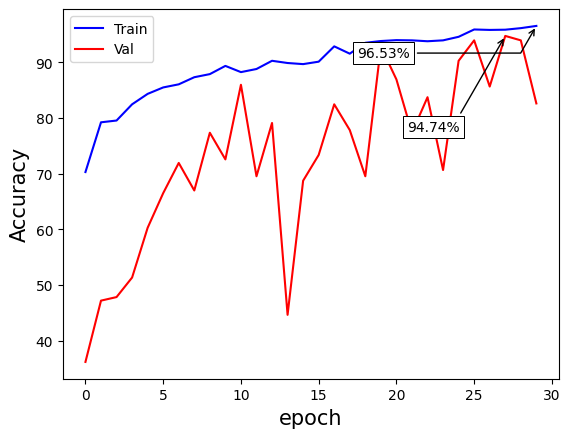

In [153]:
plot_accuracy(model_fit)

### Tensorboard

In [151]:

%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


### Model Evaluation, Mlflow Logging and Printing Metrics

2025/02/08 18:37:44 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.
2025/02/08 18:37:52 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.



train Metrics:
 Accuracy: 97.69%
 Precision: 97.96%
 Recall: 97.88%

val Metrics:
 Accuracy: 94.74%
 Precision: 95.01%
 Recall: 94.79%

test Metrics:
 Accuracy: 92.88%
 Precision: 92.62%
 Recall: 92.35%


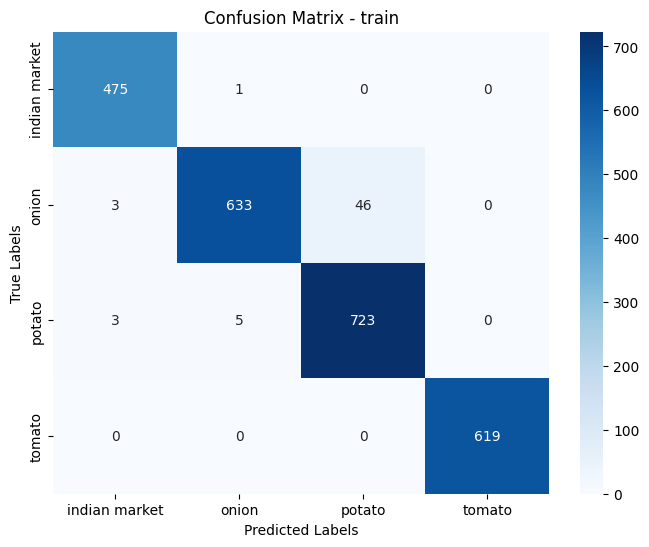

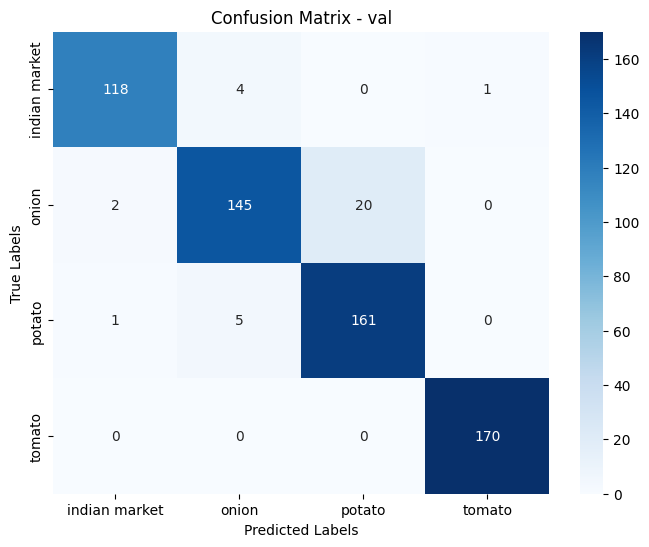

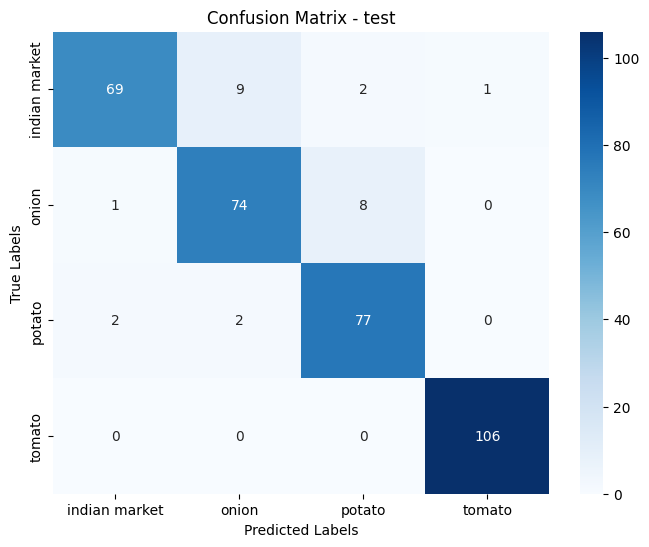


Classification Report - train
               precision    recall  f1-score   support

indian market       0.99      1.00      0.99       476
        onion       0.99      0.93      0.96       682
       potato       0.94      0.99      0.96       731
       tomato       1.00      1.00      1.00       619

     accuracy                           0.98      2508
    macro avg       0.98      0.98      0.98      2508
 weighted avg       0.98      0.98      0.98      2508


Classification Report - val
               precision    recall  f1-score   support

indian market       0.98      0.96      0.97       123
        onion       0.94      0.87      0.90       167
       potato       0.89      0.96      0.93       167
       tomato       0.99      1.00      1.00       170

     accuracy                           0.95       627
    macro avg       0.95      0.95      0.95       627
 weighted avg       0.95      0.95      0.95       627


Classification Report - test
               precision

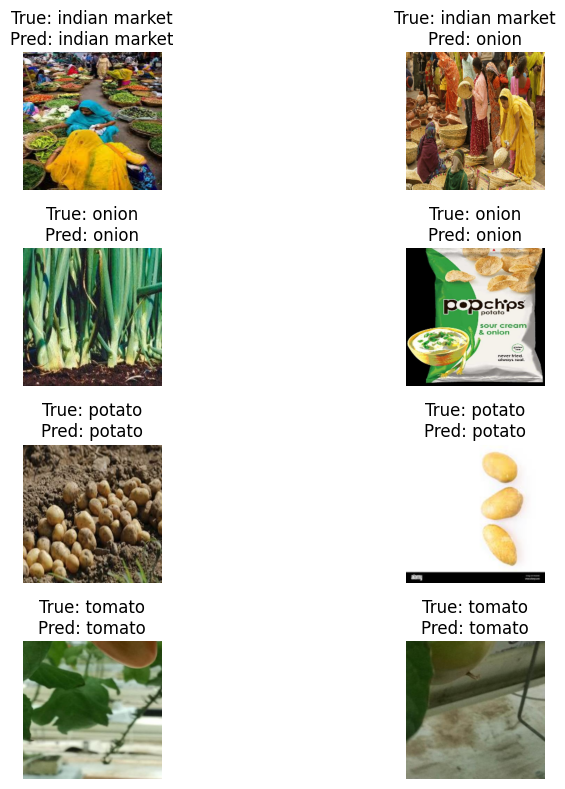

In [152]:
evaluate_model(model, train_ds, val_ds, test_ds, class_names,run_name=f"{model.name}",ckpt_path= f"checkpoints/{model.name}.weights.h5")

# DATA AUGMENTATION AND TRAINING BEST MODEL FROM SCRATCH

In [161]:
def preprocess_v2(train_data, val_data, test_data, target_height=256, target_width=256):
    # Data preprocessing pipeline for validation and test datasets
    data_preprocess = Sequential(
        name="data_preprocess",
        layers=[
            layers.Resizing(target_height, target_width),  # Resize to target size
            layers.Rescaling(1.0 / 255),  # Normalize pixel values to [0, 1]
        ],
    )

    # Data augmentation pipeline for training dataset
    data_augmentation = Sequential(
        name="data_augmentation",
        layers=[
            layers.Resizing(156, 156),  # Resize to a larger size first
            layers.RandomCrop(target_height, target_width),  # Randomly crop to target size
            layers.RandomTranslation(height_factor=0.1, width_factor=0.1),  # Random translation
            layers.RandomRotation(0.2),  # Random rotation (in radians)
            layers.RandomBrightness(0.2),  # Random brightness adjustment
            layers.RandomContrast(0.2),  # Random contrast adjustment
            layers.Rescaling(1.0 / 255),  # Normalize pixel values to [0, 1]
        ],
    )

    # Apply data augmentation to the training dataset
    train_aug_ds = train_data.map(
        lambda x, y: (data_augmentation(x), y), num_parallel_calls=tf.data.AUTOTUNE
    ).prefetch(tf.data.AUTOTUNE)

    # Apply preprocessing to the validation dataset
    val_aug_ds = val_data.map(
        lambda x, y: (data_preprocess(x), y), num_parallel_calls=tf.data.AUTOTUNE
    ).prefetch(tf.data.AUTOTUNE)

    # Apply preprocessing to the test dataset
    test_aug_ds = test_data.map(
        lambda x, y: (data_preprocess(x), y), num_parallel_calls=tf.data.AUTOTUNE
    ).prefetch(tf.data.AUTOTUNE)

    return train_aug_ds, val_aug_ds, test_aug_ds


In [162]:
train_aug_ds, val_aug_ds, test_aug_ds = preprocess_v2(train_data, val_data, test_data)

In [163]:
model = arch_3()
model.summary()

Model: "cnn_multiple_conv_bn_reg"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_42 (Conv2D)              │ (None, 128, 128, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_24 (Activation)      │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 128, 128, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_34 (MaxPooling2D) │ (None, 64, 64, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_43 (Conv2D)              │ (None, 64, 64, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_25 (Activation)      │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_25          │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_35 (MaxPooling2D) │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_44 (Conv2D)              │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_26 (Activation)      │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_26          │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_36 (MaxPooling2D) │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_45 (Conv2D)              │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_27 (Activation)      │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_27          │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_37 (MaxPooling2D) │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_46 (Conv2D)              │ (None, 8, 8, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_28 (Activation)      │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_28          │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_8      │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_29 (Activation)      │ (None, 256)            │             

 Total params: 462,436 (1.76 MB)

 Trainable params: 460,932 (1.76 MB)

 Non-trainable params: 1,504 (5.88 KB)

### Model Compilation and Training including all Callback Features

In [164]:
model_fit = compile_train(model, train_aug_ds, val_aug_ds, epochs=100,ckpt_path=f"checkpoints/{model.name}_aug.weights.h5")

Epoch 1/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 68s 796ms/step - accuracy: 0.6001 - loss: 1.8688 - precision_8: 0.6215 - recall_8: 0.5635 - val_accuracy: 0.2663 - val_loss: 2.4539 - val_precision_8: 0.2668 - val_recall_8: 0.2663 - learning_rate: 0.0010
Epoch 2/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 64s 799ms/step - accuracy: 0.7351 - loss: 1.3067 - precision_8: 0.7635 - recall_8: 0.7036 - val_accuracy: 0.4864 - val_loss: 1.8780 - val_precision_8: 0.5800 - val_recall_8: 0.3238 - learning_rate: 0.0010
Epoch 3/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 64s 802ms/step - accuracy: 0.7701 - loss: 1.2321 - precision_8: 0.8012 - recall_8: 0.7361 - val_accuracy: 0.4737 - val_loss: 2.0605 - val_precision_8: 0.5309 - val_recall_8: 0.4115 - learning_rate: 0.0010
Epoch 4/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 63s 787ms/step - accuracy: 0.7469 - loss: 1.2575 - precision_8: 0.7725 - recall_8: 0.7214 - val_accuracy: 0.4976 - val_loss: 1.7257 - val_precision_8: 0.5196 - val_recall_8: 0.4657 - learning_rate: 0.0010
Epoch 5/100
79/79 ━━━━━━

### Plot accuracy for training and validation wrt epoch

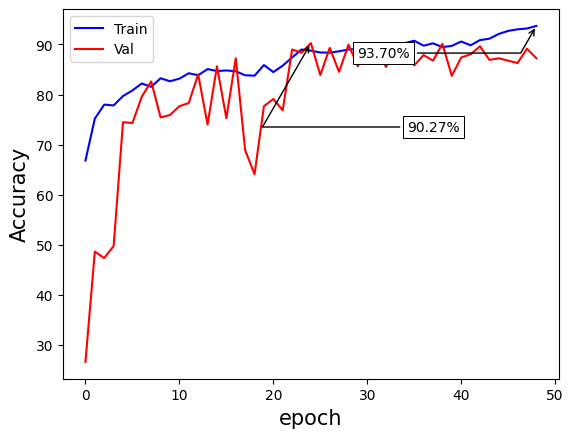

In [165]:
plot_accuracy(model_fit)

### Tensorboard

In [166]:

%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


### Model Evaluation, Mlflow Logging and Printing Metrics

2025/02/08 20:15:01 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.
2025/02/08 20:15:28 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.



train Metrics:
 Accuracy: 91.31%
 Precision: 91.72%
 Recall: 91.66%

val Metrics:
 Accuracy: 90.27%
 Precision: 90.69%
 Recall: 90.23%

test Metrics:
 Accuracy: 85.75%
 Precision: 86.18%
 Recall: 84.73%


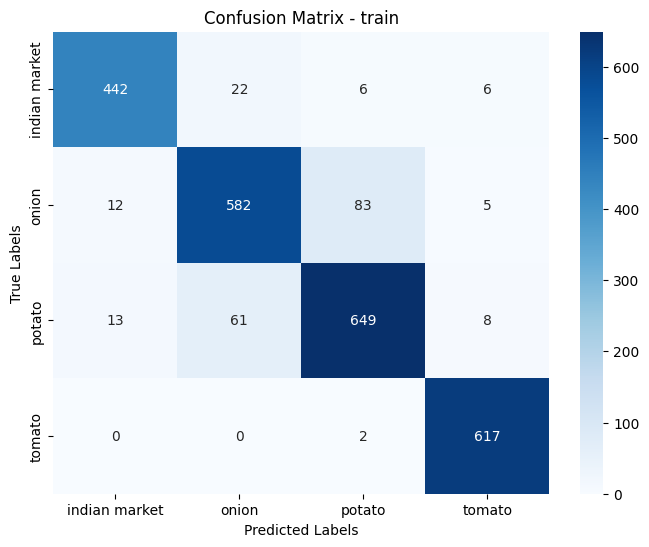

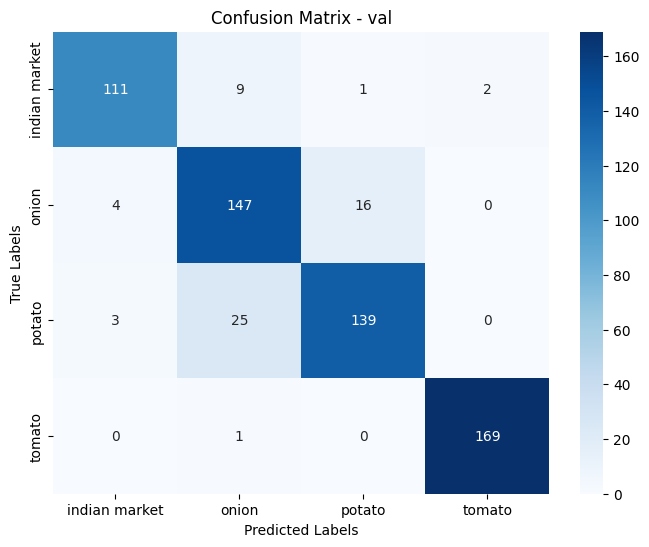

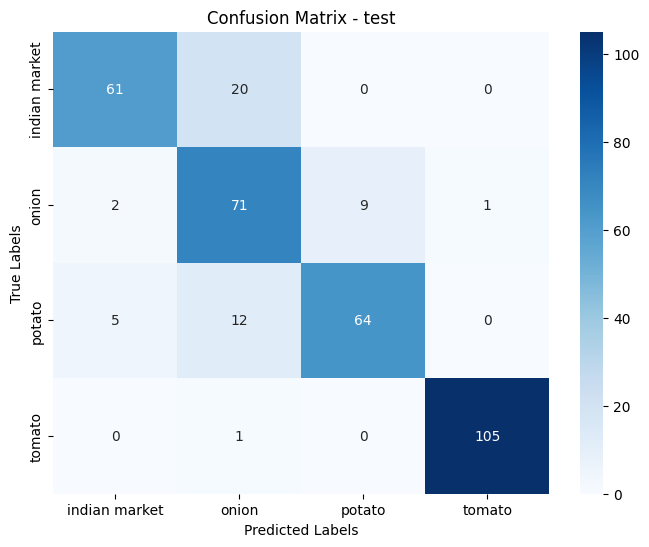


Classification Report - train
               precision    recall  f1-score   support

indian market       0.95      0.93      0.94       476
        onion       0.88      0.85      0.86       682
       potato       0.88      0.89      0.88       731
       tomato       0.97      1.00      0.98       619

     accuracy                           0.91      2508
    macro avg       0.92      0.92      0.92      2508
 weighted avg       0.91      0.91      0.91      2508


Classification Report - val
               precision    recall  f1-score   support

indian market       0.94      0.90      0.92       123
        onion       0.81      0.88      0.84       167
       potato       0.89      0.83      0.86       167
       tomato       0.99      0.99      0.99       170

     accuracy                           0.90       627
    macro avg       0.91      0.90      0.90       627
 weighted avg       0.90      0.90      0.90       627


Classification Report - test
               precision

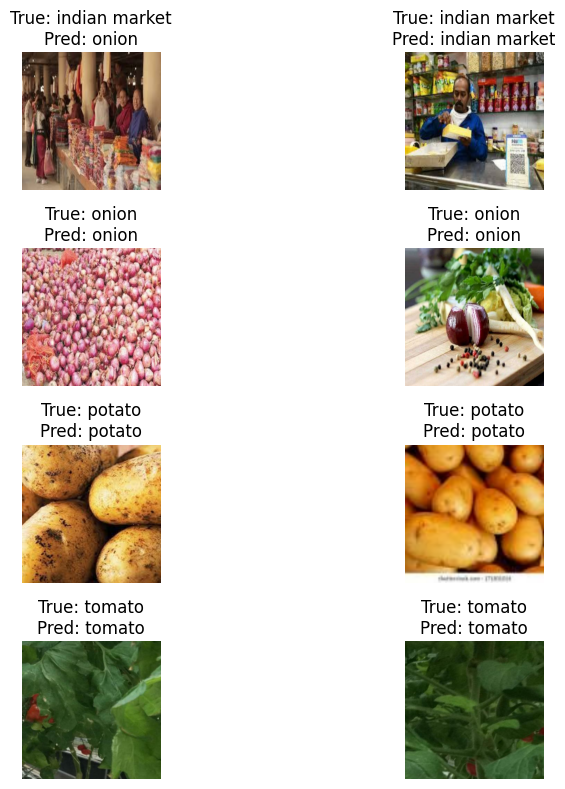

In [167]:
evaluate_model(model, train_aug_ds, val_aug_ds, test_aug_ds, class_names,run_name=f"{model.name}_aug",ckpt_path= f"checkpoints/{model.name}_aug.weights.h5")

# PRE TRAINED MODELS

# Lenet model

In [89]:
lenet_model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(128,128,3)),
    tf.keras.layers.Conv2D(6, kernel_size=(5,5),
                        activation= 'sigmoid'),
    tf.keras.layers.AveragePooling2D(pool_size=(2,2), strides= (2,2)),
    tf.keras.layers.Conv2D(16, kernel_size=(5,5),
                        activation= 'sigmoid'),
    tf.keras.layers.AveragePooling2D(pool_size=(2,2), strides= (2,2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(120, activation= 'sigmoid'),
    tf.keras.layers.Dense(84, activation= 'sigmoid'),
    tf.keras.layers.Dense(4, activation= 'softmax'),

])

In [90]:
lenet_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)               │ (None, 124, 124, 6)    │           456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_4             │ (None, 62, 62, 6)      │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 58, 58, 16)     │         2,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_5             │ (None, 29, 29, 16)     │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 13456)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 120)            │     1,614,840 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 84)             │        10,164 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 4)              │           340 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,628,216 (6.21 MB)

 Trainable params: 1,628,216 (6.21 MB)

 Non-trainable params: 0 (0.00 B)

In [91]:
# Assuming lenet_model, train_ds, and val_ds are defined already
model_fit = compile_train_v2(
    model=lenet_model,
    train_ds=train_aug_ds,
    val_ds=val_aug_ds,
    epochs=100,  # Number of epochs for training
    ckpt_path="lenet_model_best.weights.h5"  # Path to save the best model weights
)


Epoch 1/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - accuracy: 0.2947 - loss: 1.4085 - val_accuracy: 0.2663 - val_loss: 1.4075 - learning_rate: 0.0010
Epoch 2/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - accuracy: 0.3023 - loss: 1.3725 - val_accuracy: 0.2663 - val_loss: 1.3927 - learning_rate: 0.0010
Epoch 3/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.3005 - loss: 1.3750 - val_accuracy: 0.2663 - val_loss: 1.4104 - learning_rate: 0.0010
Epoch 4/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - accuracy: 0.3115 - loss: 1.3727 - val_accuracy: 0.2663 - val_loss: 1.3950 - learning_rate: 0.0010
Epoch 5/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - accuracy: 0.2916 - loss: 1.3733 - val_accuracy: 0.2663 - val_loss: 1.3853 - learning_rate: 0.0010
Epoch 6/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - accuracy: 0.3005 - loss: 1.3719 - val_accuracy: 0.2663 - val_loss: 1.3944 - learning_rate: 0.0010
Epoch 7/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - accuracy: 0.3064 - loss: 1.3751 - 

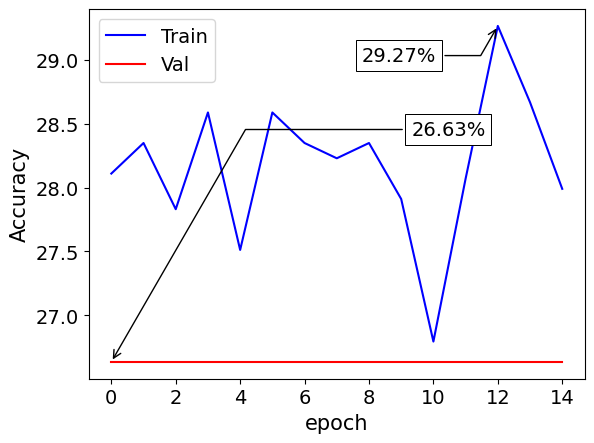

In [92]:
plot_accuracy(model_fit)

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

Test Accuracy: 23.08%

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


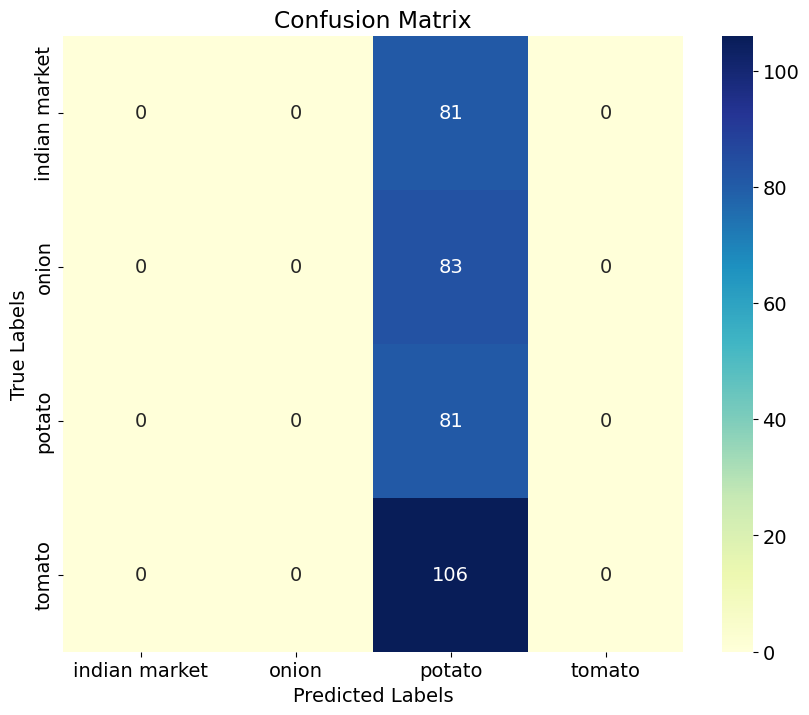

In [95]:
print_accuracy_stats(lenet_model, test_aug_ds, class_names,ckpt_path="lenet_model_best.weights.h5")
plot_confusion_matrix(lenet_model, test_aug_ds, class_names,ckpt_path="lenet_model_best.weights.h5")

# VGG 16 model

In [96]:
# VGG 16 Model
# If the commented Conv2D layer is uncommented then it becomes VGG 19
# FC layers are commented so that faster training occur
vgg16_model = tf.keras.Sequential([
        tf.keras.layers.Input(shape = (128 ,128, 3)),
        tf.keras.layers.Conv2D(64, kernel_size=(3,3), padding= 'same',
                        activation= 'relu'),
        tf.keras.layers.Conv2D(64, kernel_size=(3,3), padding= 'same',
                        activation= 'relu'),
        tf.keras.layers.MaxPooling2D(pool_size=(2,2), strides= (2,2)),

        tf.keras.layers.Conv2D(128, kernel_size=(3,3), padding= 'same',
                        activation= 'relu'),
        tf.keras.layers.Conv2D(128, kernel_size=(3,3), padding= 'same',
                        activation= 'relu'),
        tf.keras.layers.MaxPooling2D(pool_size=(2,2), strides= (2,2)),

        tf.keras.layers.Conv2D(256, kernel_size=(3,3), padding= 'same',
                        activation= 'relu'),
        tf.keras.layers.Conv2D(256, kernel_size=(3,3), padding= 'same',
                        activation= 'relu'),
        tf.keras.layers.Conv2D(256, kernel_size=(3,3), padding= 'same',
                        activation= 'relu'),
        #tf.keras.layers.Conv2D(256, kernel_size=(3,3), padding= 'same',
        #                activation= 'relu'),
        tf.keras.layers.MaxPooling2D(pool_size=(2,2), strides= (2,2)),

        tf.keras.layers.Conv2D(512, kernel_size=(3,3), padding= 'same',
                        activation= 'relu'),
        tf.keras.layers.Conv2D(512, kernel_size=(3,3), padding= 'same',
                        activation= 'relu'),
        tf.keras.layers.Conv2D(512, kernel_size=(3,3), padding= 'same',
                        activation= 'relu'),
        #tf.keras.layers.Conv2D(512, kernel_size=(3,3),padding= 'same',
        #                activation= 'relu'),
        tf.keras.layers.MaxPooling2D(pool_size=(2,2), strides= (2,2)),

        tf.keras.layers.Conv2D(512, kernel_size=(3,3),padding= 'same',
                        activation= 'relu'),
        tf.keras.layers.Conv2D(512, kernel_size=(3,3),padding= 'same',
                        activation= 'relu'),
        tf.keras.layers.Conv2D(512, kernel_size=(3,3),padding= 'same',
                        activation= 'relu'),
        #tf.keras.layers.Conv2D(512, kernel_size=(3,3), padding= 'same',
        #                activation= 'relu'),
        tf.keras.layers.MaxPooling2D(pool_size=(2,2), strides= (2,2)),

        tf.keras.layers.Flatten(),
        #tf.keras.layers.Dense(4096, activation= 'relu'),
        #tf.keras.layers.Dropout(0.5),
        #tf.keras.layers.Dense(4096, activation= 'relu'),
        #tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(4, activation= 'softmax')
        ])



In [97]:
vgg16_model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_11 (Conv2D)              │ (None, 128, 128, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 64, 64, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 32, 32, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 32, 32, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 16, 16, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 4)              │        32,772 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,747,460 (56.26 MB)

 Trainable params: 14,747,460 (56.26 MB)

 Non-trainable params: 0 (0.00 B)

In [101]:
import functools
from tensorflow.keras.optimizers import Adam,SGD
# top5_acc = functools.partial(tf.keras.metrics.top_k_categorical_accuracy())

opt = SGD(learning_rate=0.005, momentum=0.99)
vgg16_model.compile(
    optimizer=opt,
    loss = 'categorical_crossentropy',
    metrics=['accuracy']
)
print(vgg16_model.optimizer.get_config())
history = vgg16_model.fit(train_aug_ds,  epochs=5,
                    validation_data=val_aug_ds
                   )

{'name': 'SGD', 'learning_rate': 0.004999999888241291, 'weight_decay': None, 'clipnorm': None, 'global_clipnorm': None, 'clipvalue': None, 'use_ema': False, 'ema_momentum': 0.99, 'ema_overwrite_frequency': None, 'loss_scale_factor': None, 'gradient_accumulation_steps': None, 'momentum': 0.99, 'nesterov': False}
Epoch 1/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 368s 5s/step - accuracy: 0.2927 - loss: 1.3810 - val_accuracy: 0.3110 - val_loss: 1.3647
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 385s 5s/step - accuracy: 0.3672 - loss: 1.2471 - val_accuracy: 0.4545 - val_loss: 1.2505
Epoch 3/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 301s 4s/step - accuracy: 0.4500 - loss: 1.1587 - val_accuracy: 0.4434 - val_loss: 1.5508
Epoch 4/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 213s 3s/step - accuracy: 0.3431 - loss: 1.3648 - val_accuracy: 0.2663 - val_loss: 1.4097
Epoch 5/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 211s 3s/step - accuracy: 0.3439 - loss: 1.3293 - val_accuracy: 0.4370 - val_loss: 1.3323


In [102]:
# Saving the Model
vgg16_model.save("vgg16_model_scratch.h5")

In [103]:
import gdown

# File ID from your URL
file_id = "1dwwgrguj9NDIgdnFfdnYZoMsBFVMD3xV"
url = f"https://drive.google.com/uc?id={file_id}"

# Output file name
output = "downloaded_vgg16_file"

# Download the file
gdown.download(url, output, quiet=False)

print(f"File downloaded as {output}")


Downloading...
From (original): https://drive.google.com/uc?id=1dwwgrguj9NDIgdnFfdnYZoMsBFVMD3xV
From (redirected): https://drive.google.com/uc?id=1dwwgrguj9NDIgdnFfdnYZoMsBFVMD3xV&confirm=t&uuid=3384f62c-3e47-4893-8110-d1d2d8258c4a
To: c:\Users\saina\Desktop\DS_ML_AI\Scaler\Module_20_Computer_Vision\Case_studies\Ninja_cart\Multiclass_Vegetable_Image_Classification_Using_Deep_Learning\notebook\downloaded_vgg16_file
100%|██████████| 120M/120M [00:23<00:00, 5.04MB/s] 

File downloaded as downloaded_vgg16_file


In [111]:

# Loading the model
vgg16_model_scratch = tf.keras.models.load_model("vgg16_model_scratch.h5")

In [112]:
def training_plot(metrics, history):
  f, ax = plt.subplots(1, len(metrics), figsize=(5*len(metrics), 5))
  for idx, metric in enumerate(metrics):
    ax[idx].plot(history.history[metric], ls='dashed')
    ax[idx].set_xlabel("Epochs")
    ax[idx].set_ylabel(metric)
    ax[idx].plot(history.history['val_' + metric]);
    ax[idx].legend([metric, 'val_' + metric])

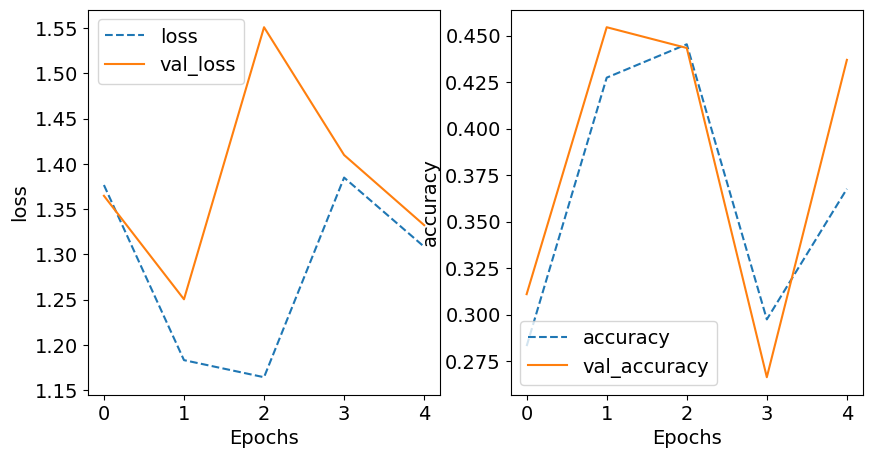

In [113]:
training_plot(['loss', 'accuracy'], history)

In [114]:
# Evaluate the model
loss, acc = vgg16_model_scratch.evaluate(test_aug_ds, verbose=2)
print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

11/11 - 7s - 664ms/step - accuracy: 0.4587 - loss: 1.3346
Restored model, accuracy: 45.87%


# pretrained vgg16

In [166]:
import tensorflow as tf

# Load VGG16 pre-trained model
pretrained_model = tf.keras.applications.VGG16(
    weights='imagenet',  # Use pre-trained weights
    include_top=False,  # Exclude the top layers
    input_shape=(128, 128, 3)  # Input shape
)
pretrained_model.trainable = False  # Freeze the pre-trained layers

# Use Functional API for more flexibility
inputs = tf.keras.Input(shape=(128, 128, 3))  # Explicit input layer
x = pretrained_model(inputs)  # Pass inputs through the pre-trained model
x = tf.keras.layers.GlobalAveragePooling2D()(x)  # Add global average pooling
outputs = tf.keras.layers.Dense(4, activation='softmax')(x)  # Add classification layer
vgg16_model = tf.keras.Model(inputs=inputs, outputs=outputs)  # Define the full model

# Display the model summary
vgg16_model.summary()


Model: "functional_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_40 (InputLayer)     │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_15     │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,716,740 (56.14 MB)

 Trainable params: 2,052 (8.02 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [167]:
import functools
# top5_acc = functools.partial(tf.keras.metrics.SparseTopKCategoricalAccuracy())

vgg16_model.compile(
    optimizer='adam',
    loss = 'categorical_crossentropy',
    metrics=['accuracy']
)

In [168]:
history = vgg16_model.fit(train_aug_ds, epochs=100,
                    validation_data=val_aug_ds)

Epoch 1/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 65s 811ms/step - accuracy: 0.3525 - loss: 1.3598 - val_accuracy: 0.7113 - val_loss: 0.9446
Epoch 2/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 65s 819ms/step - accuracy: 0.6932 - loss: 0.9154 - val_accuracy: 0.7815 - val_loss: 0.7355
Epoch 3/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 65s 816ms/step - accuracy: 0.7517 - loss: 0.7491 - val_accuracy: 0.8038 - val_loss: 0.6406
Epoch 4/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 65s 820ms/step - accuracy: 0.7794 - loss: 0.6530 - val_accuracy: 0.8006 - val_loss: 0.5902
Epoch 5/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 66s 827ms/step - accuracy: 0.7933 - loss: 0.6138 - val_accuracy: 0.8150 - val_loss: 0.5514
Epoch 6/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 64s 814ms/step - accuracy: 0.7961 - loss: 0.5779 - val_accuracy: 0.8198 - val_loss: 0.5311
Epoch 7/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 65s 821ms/step - accuracy: 0.8056 - loss: 0.5514 - val_accuracy: 0.8134 - val_loss: 0.5058
Epoch 8/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 64s 814ms/step - accuracy: 0.8034 - loss: 0.5413 - 

In [169]:
vgg16_model.save("vgg16_model_pretrained.keras")

In [170]:
# Saving the Model
vgg16_model_pretrained = vgg16_model.save("vgg16_model_pretrained.h5")

In [171]:
def training_plot(metrics, history):
  f, ax = plt.subplots(1, len(metrics), figsize=(5*len(metrics), 5))
  for idx, metric in enumerate(metrics):
    ax[idx].plot(history.history[metric], ls='dashed')
    ax[idx].set_xlabel("Epochs")
    ax[idx].set_ylabel(metric)
    ax[idx].plot(history.history['val_' + metric]);
    ax[idx].legend([metric, 'val_' + metric])

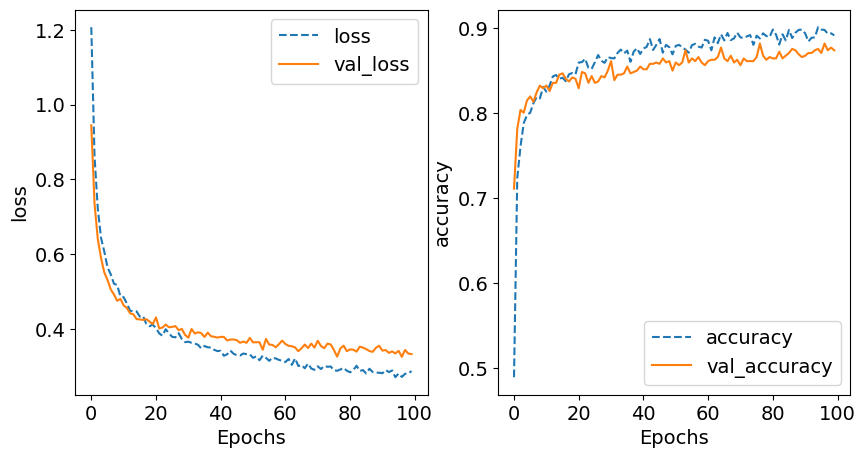

In [172]:
training_plot(['loss', 'accuracy'], history)

In [173]:
vgg16_model_pretrained = tf.keras.models.load_model("vgg16_model_pretrained.keras")    

In [174]:
print(vgg16_model_pretrained)


<Functional name=functional_45, built=True>


In [175]:
# Evaluate the model
loss, acc = vgg16_model_pretrained.evaluate(test_aug_ds, verbose=2)
print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

11/11 - 8s - 709ms/step - accuracy: 0.8234 - loss: 0.4064
Restored model, accuracy: 82.34%


In [176]:
def plot_image(pred_array, true_label, img):
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])

  plt.imshow(img, cmap=plt.cm.binary)

  predicted_label = np.argmax(pred_array)
  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("{} {:2.0f}% ".format(class_names[predicted_label],
                                100*np.max(pred_array),
                                ),
                                color=color)


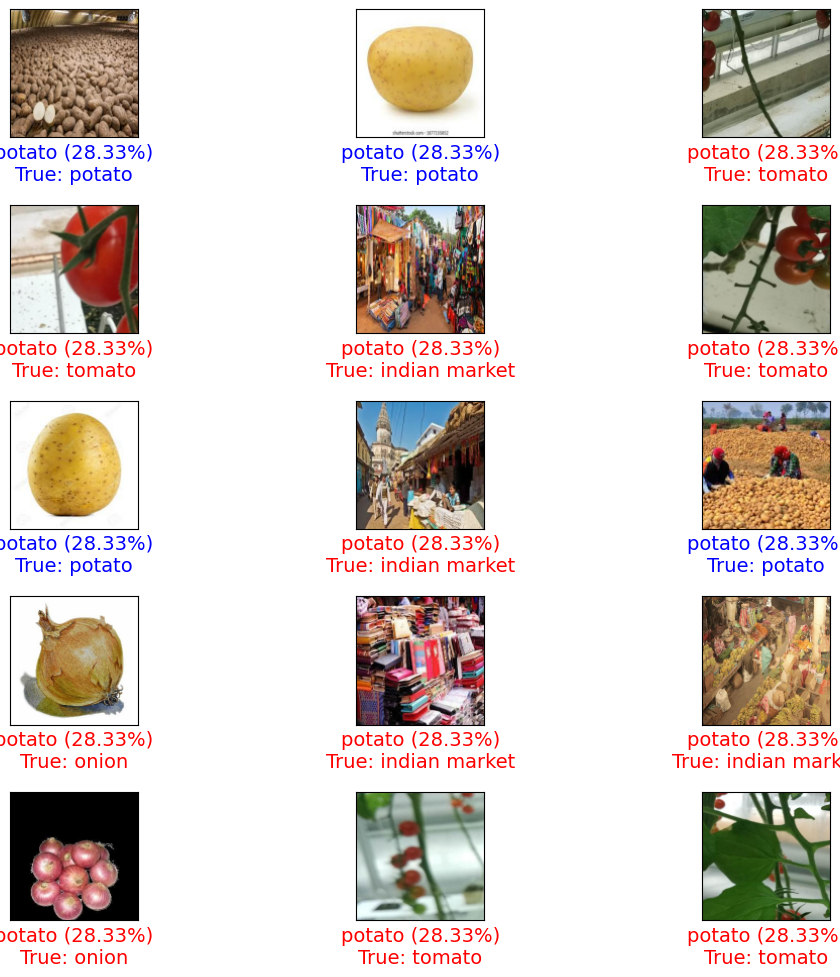

In [177]:
def plot_image(pred_array, true_label, img, class_names):
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    # Convert image back to uint8 if it's normalized
    img = tf.clip_by_value(img, 0.0, 1.0)  # Ensure pixel values are in [0, 1]
    img = (img * 255).numpy().astype("uint8")  # Scale back to [0, 255] if necessary

    # Plot the image
    plt.imshow(img)

    predicted_label = np.argmax(pred_array)
    true_label = np.argmax(true_label)  # Convert one-hot encoded true label to scalar
    if predicted_label == true_label:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel(
        f"{class_names[predicted_label]} ({100 * np.max(pred_array):.2f}%)\nTrue: {class_names[true_label]}",
        color=color
    )

# Randomly sample 15 test images and plot them
indices = random.sample(range(len(images)), 15)
num_rows, num_cols = 5, 3
plt.figure(figsize=(4 * num_cols, 2 * num_rows))
for i, index in enumerate(indices):
    plt.subplot(num_rows, num_cols, i + 1)
    plot_image(y_pred[index], true_categories[index], images[index], class_names)

plt.tight_layout()
plt.show()


# Inception net

In [178]:
train_aug_ds

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 4), dtype=tf.float32, name=None))>

InceptionV3 Model Summary:


Model: "functional_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_44 (InputLayer)     │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_v3 (Functional)       │ (None, 2, 2, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_16     │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 4)              │         8,196 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,810,980 (83.20 MB)

 Trainable params: 8,196 (32.02 KB)

 Non-trainable params: 21,802,784 (83.17 MB)


ResNet50 Model Summary:


Model: "functional_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_45 (InputLayer)     │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 4, 4, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_17     │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 4)              │         8,196 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,595,908 (90.01 MB)

 Trainable params: 8,196 (32.02 KB)

 Non-trainable params: 23,587,712 (89.98 MB)


MobileNetV2 Model Summary:


Model: "functional_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_46 (InputLayer)     │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_128            │ (None, 4, 4, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_18     │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 4)              │         5,124 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,263,108 (8.63 MB)

 Trainable params: 5,124 (20.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

Epoch 1/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 216ms/step - accuracy: 0.5525 - loss: 1.4390 - val_accuracy: 0.8405 - val_loss: 0.5326
Epoch 2/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 16s 194ms/step - accuracy: 0.8231 - loss: 0.4985 - val_accuracy: 0.8676 - val_loss: 0.4103
Epoch 3/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 16s 193ms/step - accuracy: 0.8513 - loss: 0.4250 - val_accuracy: 0.8772 - val_loss: 0.3776
Epoch 4/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 192ms/step - accuracy: 0.8606 - loss: 0.3870 - val_accuracy: 0.8788 - val_loss: 0.3903
Epoch 5/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 192ms/step - accuracy: 0.8591 - loss: 0.3805 - val_accuracy: 0.8533 - val_loss: 0.4980
Epoch 6/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 16s 198ms/step - accuracy: 0.8756 - loss: 0.3702 - val_accuracy: 0.8820 - val_loss: 0.4028
Epoch 7/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - accuracy: 0.8748 - loss: 0.3693 - val_accuracy: 0.8485 - val_loss: 0.5256
Epoch 8/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 193ms/step - accuracy: 0.8781 - loss: 0.3502 - 

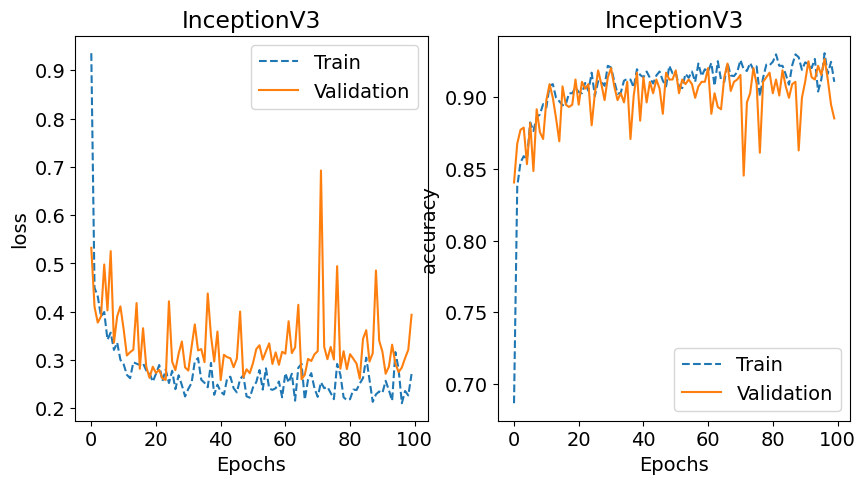

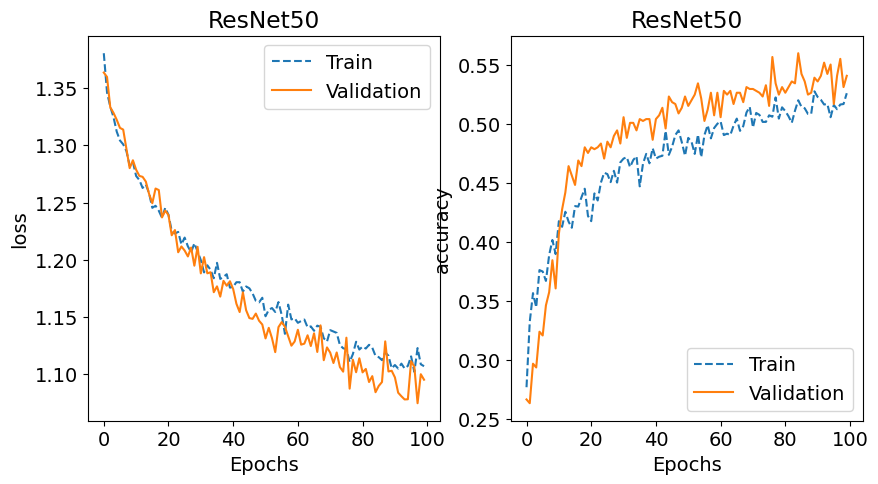

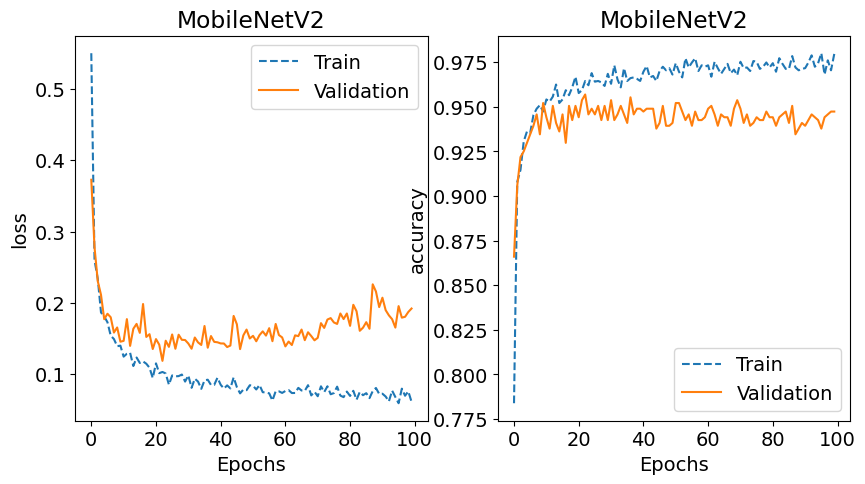

11/11 - 2s - 176ms/step - accuracy: 0.8091 - loss: 0.8076
InceptionV3 Accuracy: 80.91%
11/11 - 4s - 346ms/step - accuracy: 0.4530 - loss: 1.2113
ResNet50 Accuracy: 45.30%
11/11 - 2s - 143ms/step - accuracy: 0.9031 - loss: 0.4149
MobileNetV2 Accuracy: 90.31%
11/11 ━━━━━━━━━━━━━━━━━━━━ 5s 323ms/step


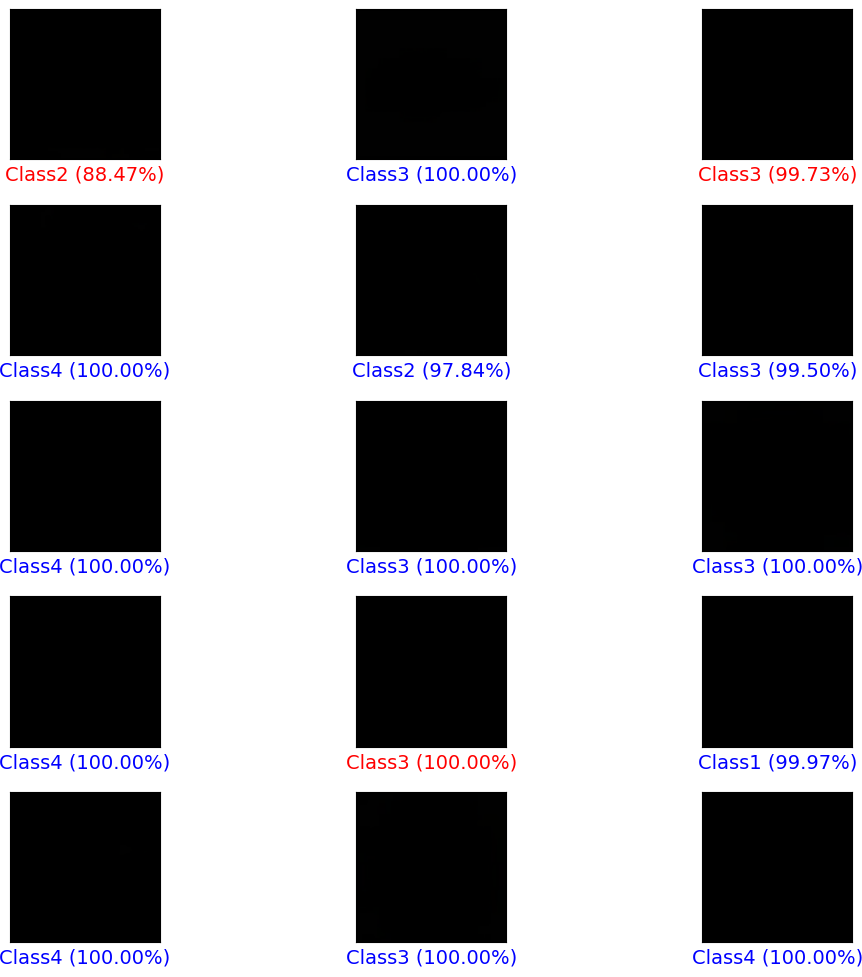

11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 460ms/step


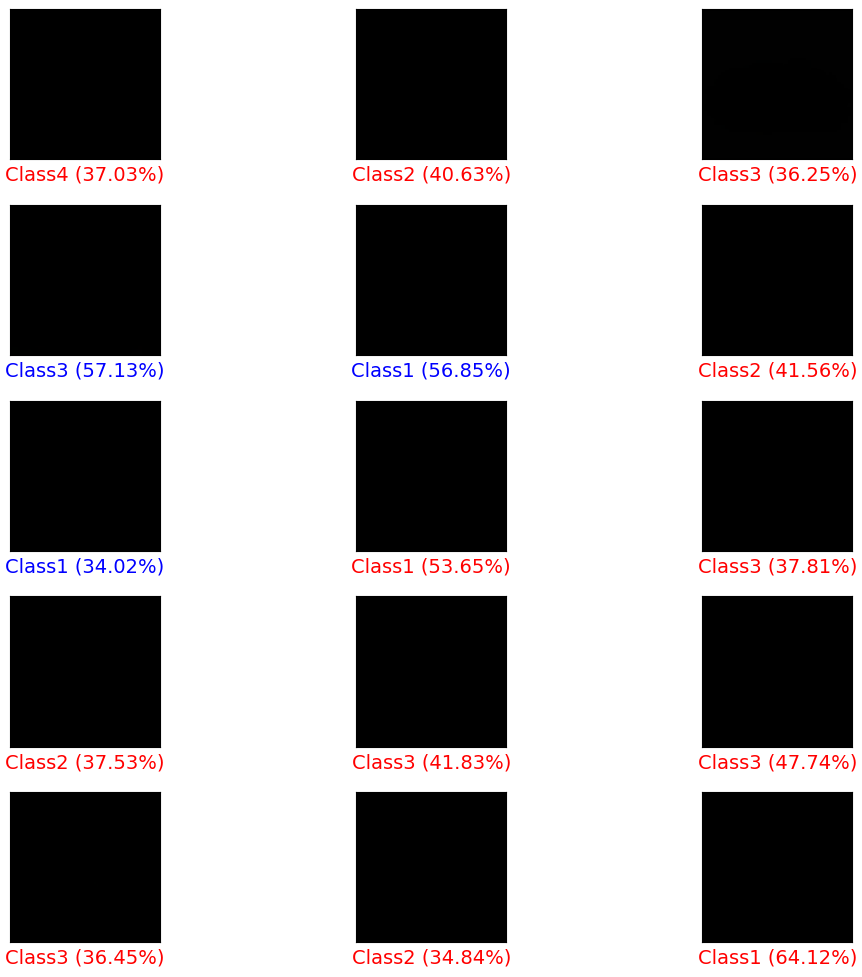

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 185ms/step


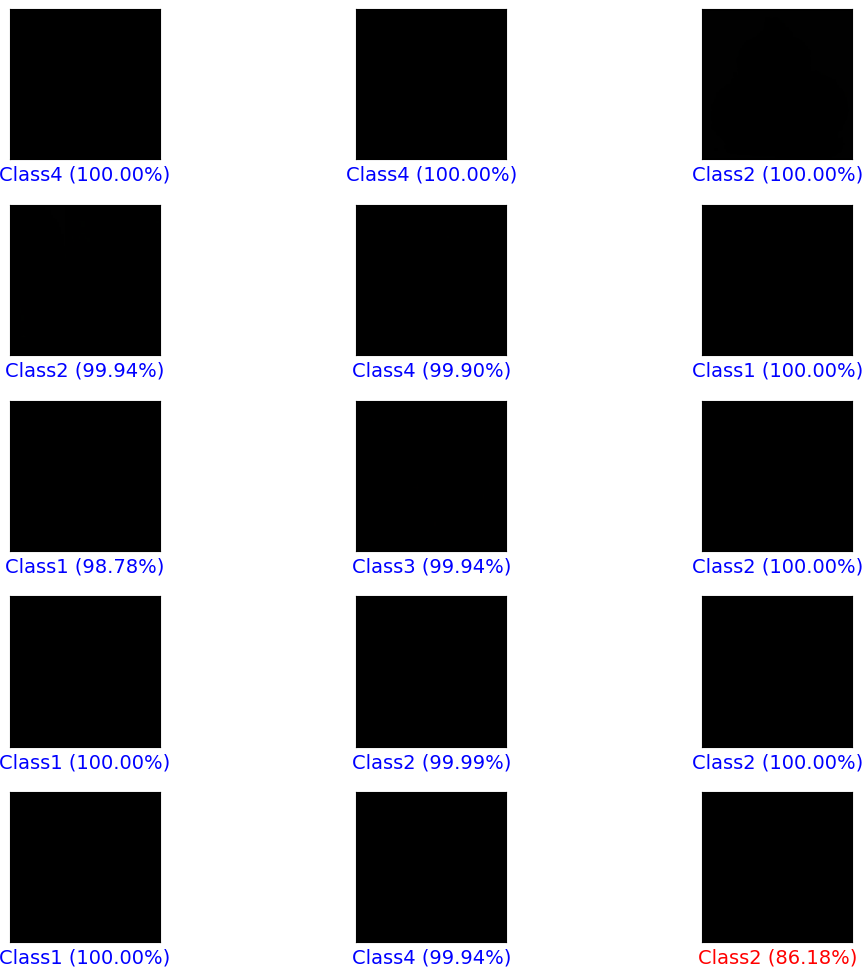

In [179]:
import tensorflow as tf
import matplotlib.pyplot as plt
import random
import numpy as np

# Assuming you already have the 'class_names' list, no need to extract it from the dataset
# Example:
class_names = ['Class1', 'Class2', 'Class3', 'Class4']  # Replace with your actual class names

# Pre-trained Model Loading and Fine-Tuning Function
def build_pretrained_model(base_model, num_classes, input_shape=(128, 128, 3)):
    base_model.trainable = False  # Freeze the base model layers
    inputs = tf.keras.Input(shape=input_shape)
    x = base_model(inputs, training=False)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(x)
    model = tf.keras.Model(inputs, outputs)
    return model

# Pre-trained Models
input_shape = (128, 128, 3)
num_classes = len(class_names)  # Set the number of classes dynamically

inception_base = tf.keras.applications.InceptionV3(
    weights='imagenet', include_top=False, input_shape=input_shape
)
resnet_base = tf.keras.applications.ResNet50(
    weights='imagenet', include_top=False, input_shape=input_shape
)
mobilenet_base = tf.keras.applications.MobileNetV2(
    weights='imagenet', include_top=False, input_shape=input_shape
)

# Build Models
inception_model = build_pretrained_model(inception_base, num_classes)
resnet_model = build_pretrained_model(resnet_base, num_classes)
mobilenet_model = build_pretrained_model(mobilenet_base, num_classes)

# Compile Models
def compile_model(model):
    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

inception_model = compile_model(inception_model)
resnet_model = compile_model(resnet_model)
mobilenet_model = compile_model(mobilenet_model)

# Summary
print("InceptionV3 Model Summary:")
inception_model.summary()
print("\nResNet50 Model Summary:")
resnet_model.summary()
print("\nMobileNetV2 Model Summary:")
mobilenet_model.summary()

# # Training and Validation Data (Replace with your datasets)
# train_aug_ds = ...  # Replace with training dataset
# val_aug_ds = ...  # Replace with validation dataset
# test_aug_ds = ...  # Replace with test dataset

# Training Function
def train_model(model, train_ds, val_ds, epochs, model_name):
    history = model.fit(
        train_ds,
        epochs=epochs,
        validation_data=val_ds
    )
    model.save(f"{model_name}.keras")
    return history

# Train Models
epochs = 100
history_inception = train_model(inception_model, train_aug_ds, val_aug_ds, epochs, "inception_model")
history_resnet = train_model(resnet_model, train_aug_ds, val_aug_ds, epochs, "resnet_model")
history_mobilenet = train_model(mobilenet_model, train_aug_ds, val_aug_ds, epochs, "mobilenet_model")

# Training Plot Function
def training_plot(metrics, history, title):
    f, ax = plt.subplots(1, len(metrics), figsize=(5 * len(metrics), 5))
    for idx, metric in enumerate(metrics):
        ax[idx].plot(history.history[metric], ls='dashed', label='Train')
        ax[idx].plot(history.history[f'val_{metric}'], label='Validation')
        ax[idx].set_xlabel("Epochs")
        ax[idx].set_ylabel(metric)
        ax[idx].legend()
        ax[idx].set_title(title)

# Plot Training Results
training_plot(['loss', 'accuracy'], history_inception, "InceptionV3")
training_plot(['loss', 'accuracy'], history_resnet, "ResNet50")
training_plot(['loss', 'accuracy'], history_mobilenet, "MobileNetV2")
plt.show()

# Evaluate Models
def evaluate_model(model, test_ds, model_name):
    loss, acc = model.evaluate(test_ds, verbose=2)
    print(f"{model_name} Accuracy: {acc * 100:.2f}%")

evaluate_model(inception_model, test_aug_ds, "InceptionV3")
evaluate_model(resnet_model, test_aug_ds, "ResNet50")
evaluate_model(mobilenet_model, test_aug_ds, "MobileNetV2")

# Plot Predictions
def plot_predictions(model, test_ds, class_names):
    true_categories = tf.concat([y for x, y in test_ds], axis=0)
    images = tf.concat([x for x, y in test_ds], axis=0)
    y_pred = model.predict(test_ds)

    indices = random.sample(range(len(images)), 15)
    num_rows, num_cols = 5, 3
    plt.figure(figsize=(4 * num_cols, 2 * num_rows))
    for i, index in enumerate(indices):
        plt.subplot(num_rows, num_cols, i + 1)
        plt.grid(False)
        plt.xticks([])  # Hide x-axis ticks
        plt.yticks([])  # Hide y-axis ticks
        plt.imshow(images[index].numpy().astype("uint8"))
        predicted_label = np.argmax(y_pred[index])
        true_label = np.argmax(true_categories[index])
        color = 'blue' if predicted_label == true_label else 'red'
        plt.xlabel(f"{class_names[predicted_label]} ({100 * np.max(y_pred[index]):.2f}%)", color=color)
    plt.tight_layout()
    plt.show()

# Plot Predictions for All Models
plot_predictions(inception_model, test_aug_ds, class_names)
plot_predictions(resnet_model, test_aug_ds, class_names)
plot_predictions(mobilenet_model, test_aug_ds, class_names)


In [ ]:
inception

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 275ms/step


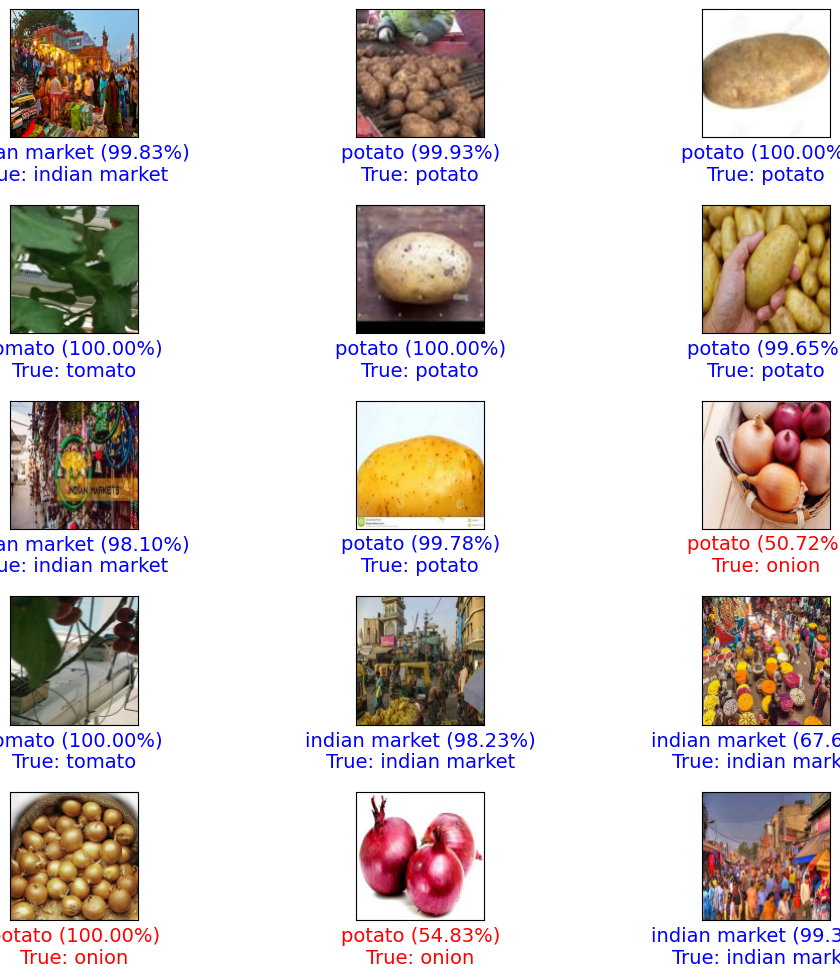

In [187]:
# Define plot function for images
def plot_image(pred_array, true_label, img, class_names):
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    img = tf.clip_by_value(img, 0.0, 1.0)  # Ensure pixel values are in [0, 1]
    img = (img * 255).numpy().astype("uint8")  # Scale back to [0, 255] if necessary

    # Plot the image
    plt.imshow(img)

    predicted_label = np.argmax(pred_array)
    true_label = np.argmax(true_label)  # Convert one-hot encoded true label to scalar
    if predicted_label == true_label:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel(
        f"{class_names[predicted_label]} ({100 * np.max(pred_array):.2f}%)\nTrue: {class_names[true_label]}",
        color=color
    )

# Randomly sample 15 test images and plot them
true_categories = tf.concat([y for x, y in test_aug_ds], axis=0)
images = tf.concat([x for x, y in test_aug_ds], axis=0)
y_pred = inception_model.predict(test_aug_ds)
class_names = test_data.class_names

indices = random.sample(range(len(images)), 15)
num_rows, num_cols = 5, 3
plt.figure(figsize=(4 * num_cols, 2 * num_rows))
for i, index in enumerate(indices):
    plt.subplot(num_rows, num_cols, i + 1)
    plot_image(y_pred[index], true_categories[index], images[index], class_names)

plt.tight_layout()
plt.show()


11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 516ms/step


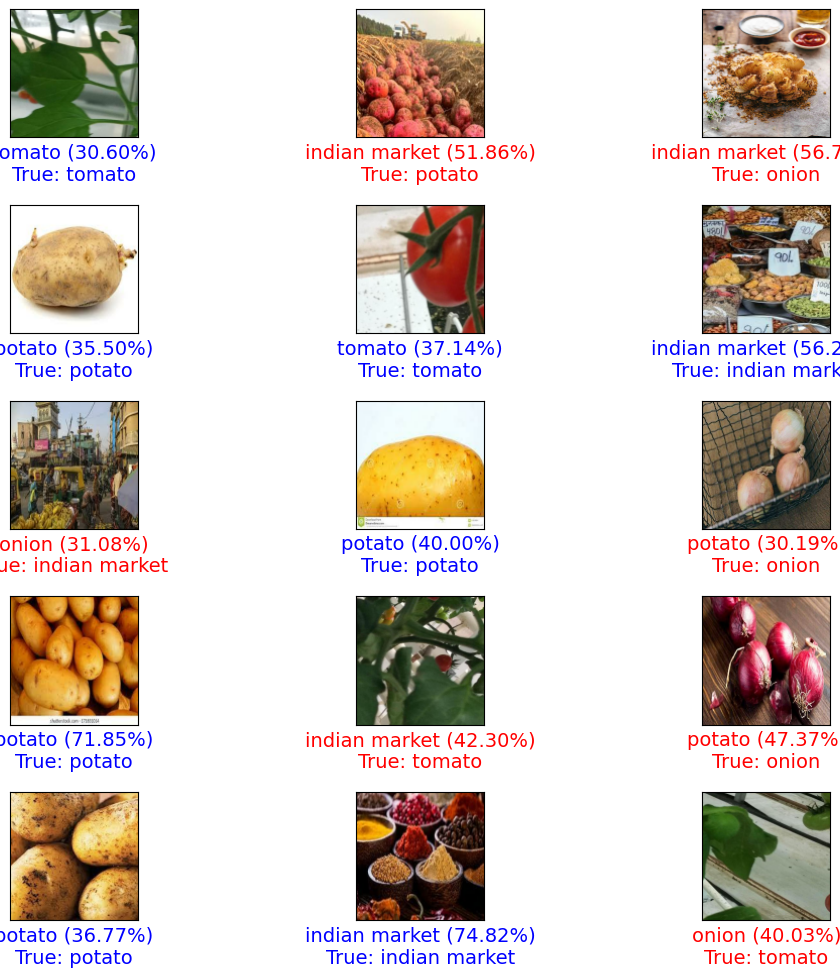

In [188]:
# Define plot function for images
def plot_image(pred_array, true_label, img, class_names):
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    img = tf.clip_by_value(img, 0.0, 1.0)  # Ensure pixel values are in [0, 1]
    img = (img * 255).numpy().astype("uint8")  # Scale back to [0, 255] if necessary

    # Plot the image
    plt.imshow(img)

    predicted_label = np.argmax(pred_array)
    true_label = np.argmax(true_label)  # Convert one-hot encoded true label to scalar
    if predicted_label == true_label:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel(
        f"{class_names[predicted_label]} ({100 * np.max(pred_array):.2f}%)\nTrue: {class_names[true_label]}",
        color=color
    )

# Randomly sample 15 test images and plot them
true_categories = tf.concat([y for x, y in test_aug_ds], axis=0)
images = tf.concat([x for x, y in test_aug_ds], axis=0)
y_pred = resnet_model.predict(test_aug_ds)
class_names = test_data.class_names

indices = random.sample(range(len(images)), 15)
num_rows, num_cols = 5, 3
plt.figure(figsize=(4 * num_cols, 2 * num_rows))
for i, index in enumerate(indices):
    plt.subplot(num_rows, num_cols, i + 1)
    plot_image(y_pred[index], true_categories[index], images[index], class_names)

plt.tight_layout()
plt.show()


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 198ms/step


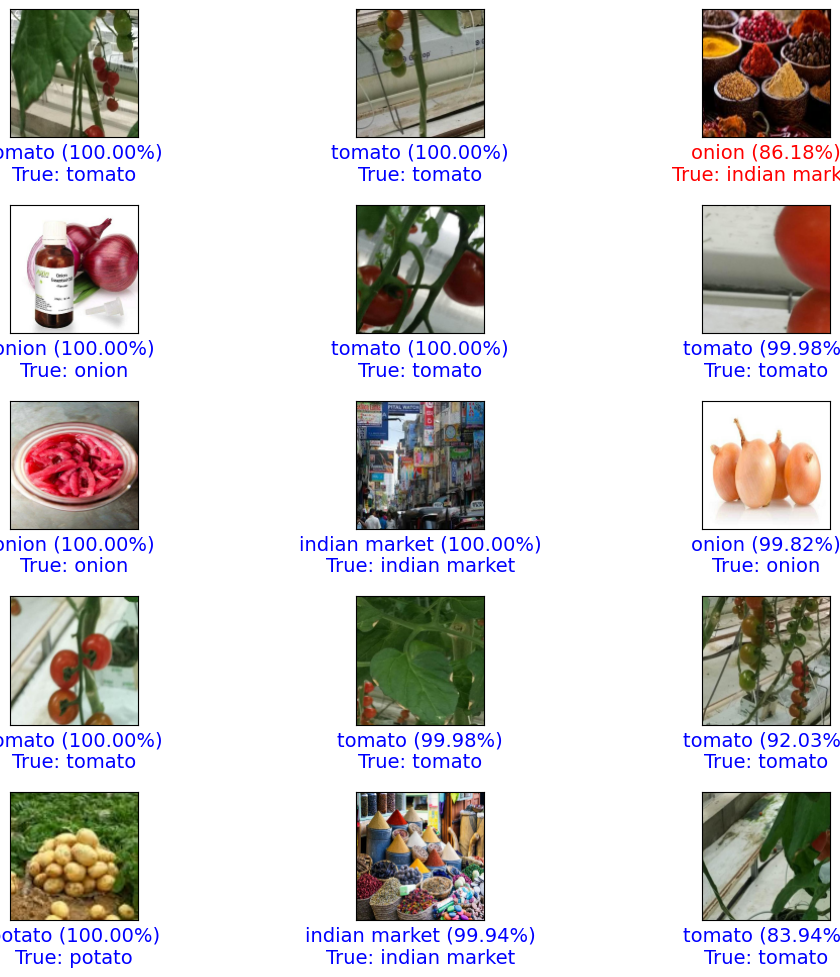

In [189]:
# Define plot function for images
def plot_image(pred_array, true_label, img, class_names):
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    img = tf.clip_by_value(img, 0.0, 1.0)  # Ensure pixel values are in [0, 1]
    img = (img * 255).numpy().astype("uint8")  # Scale back to [0, 255] if necessary

    # Plot the image
    plt.imshow(img)

    predicted_label = np.argmax(pred_array)
    true_label = np.argmax(true_label)  # Convert one-hot encoded true label to scalar
    if predicted_label == true_label:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel(
        f"{class_names[predicted_label]} ({100 * np.max(pred_array):.2f}%)\nTrue: {class_names[true_label]}",
        color=color
    )

# Randomly sample 15 test images and plot them
true_categories = tf.concat([y for x, y in test_aug_ds], axis=0)
images = tf.concat([x for x, y in test_aug_ds], axis=0)
y_pred = mobilenet_model.predict(test_aug_ds)
class_names = test_data.class_names

indices = random.sample(range(len(images)), 15)
num_rows, num_cols = 5, 3
plt.figure(figsize=(4 * num_cols, 2 * num_rows))
for i, index in enumerate(indices):
    plt.subplot(num_rows, num_cols, i + 1)
    plot_image(y_pred[index], true_categories[index], images[index], class_names)

plt.tight_layout()
plt.show()


In [180]:
class_names

['Class1', 'Class2', 'Class3', 'Class4']

# Alexnet

In [181]:
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import random
import numpy as np

# Define AlexNet architecture
def alexnet_model(input_shape=(128, 128, 3), num_classes=4):
    model = models.Sequential([
        layers.Input(shape=input_shape),
        layers.Conv2D(96, (11, 11), strides=(4, 4), activation='relu', padding='same'),
        layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2)),
        layers.Conv2D(256, (5, 5), activation='relu', padding='same'),
        layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2)),
        layers.Conv2D(384, (3, 3), activation='relu', padding='same'),
        layers.Conv2D(384, (3, 3), activation='relu', padding='same'),
        layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2)),
        layers.Flatten(),
        layers.Dense(4096, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(4096, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

# Create AlexNet model
alexnet = alexnet_model(input_shape=(128, 128, 3), num_classes=4)

# Compile the model
alexnet.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Summary of the model
alexnet.summary()


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_405 (Conv2D)             │ (None, 32, 32, 96)     │        34,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_28 (MaxPooling2D) │ (None, 15, 15, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_406 (Conv2D)             │ (None, 15, 15, 256)    │       614,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_29 (MaxPooling2D) │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_407 (Conv2D)             │ (None, 7, 7, 384)      │       885,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_408 (Conv2D)             │ (None, 7, 7, 384)      │     1,327,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_409 (Conv2D)             │ (None, 7, 7, 256)      │       884,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_30 (MaxPooling2D) │ (None, 3, 3, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 4096)           │     9,441,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 4)              │        16,388 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,986,180 (114.39 MB)

 Trainable params: 29,986,180 (114.39 MB)

 Non-trainable params: 0 (0.00 B)

In [182]:
# Train the model
history = alexnet.fit(
    train_aug_ds,
    epochs=100,
    validation_data=val_aug_ds
)


Epoch 1/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 29s 340ms/step - accuracy: 0.2929 - loss: 1.5153 - val_accuracy: 0.2663 - val_loss: 1.3801
Epoch 2/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 334ms/step - accuracy: 0.3004 - loss: 1.3711 - val_accuracy: 0.2663 - val_loss: 1.3808
Epoch 3/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 331ms/step - accuracy: 0.3126 - loss: 1.3714 - val_accuracy: 0.2663 - val_loss: 1.3795
Epoch 4/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 26s 330ms/step - accuracy: 0.3001 - loss: 1.3724 - val_accuracy: 0.2663 - val_loss: 1.3793
Epoch 5/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 331ms/step - accuracy: 0.3113 - loss: 1.3711 - val_accuracy: 0.2663 - val_loss: 1.3791
Epoch 6/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 332ms/step - accuracy: 0.3117 - loss: 1.3715 - val_accuracy: 0.2663 - val_loss: 1.3792
Epoch 7/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 26s 329ms/step - accuracy: 0.3085 - loss: 1.3707 - val_accuracy: 0.2663 - val_loss: 1.3795
Epoch 8/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 26s 331ms/step - accuracy: 0.3031 - loss: 1.3716 - 

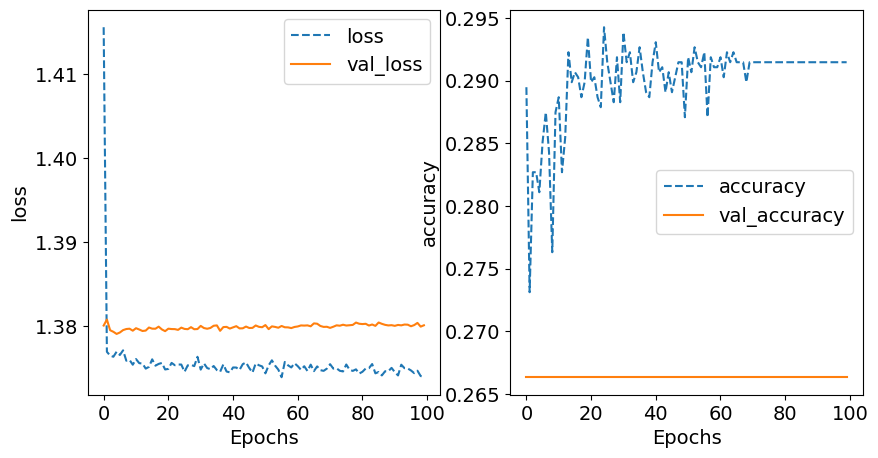

In [183]:
# Plot training history
def training_plot(metrics, history):
    f, ax = plt.subplots(1, len(metrics), figsize=(5 * len(metrics), 5))
    for idx, metric in enumerate(metrics):
        ax[idx].plot(history.history[metric], ls='dashed')
        ax[idx].set_xlabel("Epochs")
        ax[idx].set_ylabel(metric)
        ax[idx].plot(history.history['val_' + metric])
        ax[idx].legend([metric, 'val_' + metric])

training_plot(['loss', 'accuracy'], history)


In [184]:
# Evaluate the model on the test data
loss, acc = alexnet.evaluate(test_aug_ds, verbose=2)
print(f"AlexNet model accuracy: {acc * 100:.2f}%")


11/11 - 1s - 70ms/step - accuracy: 0.2308 - loss: 1.3970
AlexNet model accuracy: 23.08%


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step


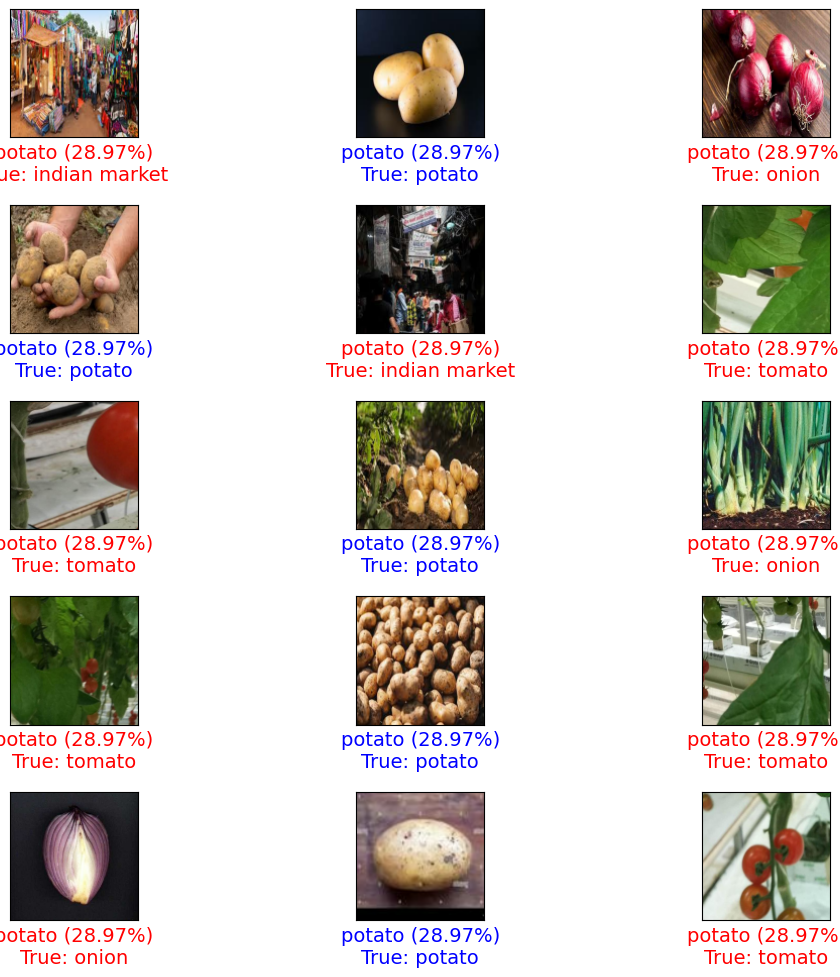

In [185]:
# Define plot function for images
def plot_image(pred_array, true_label, img, class_names):
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    img = tf.clip_by_value(img, 0.0, 1.0)  # Ensure pixel values are in [0, 1]
    img = (img * 255).numpy().astype("uint8")  # Scale back to [0, 255] if necessary

    # Plot the image
    plt.imshow(img)

    predicted_label = np.argmax(pred_array)
    true_label = np.argmax(true_label)  # Convert one-hot encoded true label to scalar
    if predicted_label == true_label:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel(
        f"{class_names[predicted_label]} ({100 * np.max(pred_array):.2f}%)\nTrue: {class_names[true_label]}",
        color=color
    )

# Randomly sample 15 test images and plot them
true_categories = tf.concat([y for x, y in test_aug_ds], axis=0)
images = tf.concat([x for x, y in test_aug_ds], axis=0)
y_pred = alexnet.predict(test_aug_ds)
class_names = test_data.class_names

indices = random.sample(range(len(images)), 15)
num_rows, num_cols = 5, 3
plt.figure(figsize=(4 * num_cols, 2 * num_rows))
for i, index in enumerate(indices):
    plt.subplot(num_rows, num_cols, i + 1)
    plot_image(y_pred[index], true_categories[index], images[index], class_names)

plt.tight_layout()
plt.show()
